# SCS-3546-008 Deep Learning Term Project: StyleGAN using Flower Dataset

## Due date: August 18th, 2020

### Group Members:
### - Dan Duong
### - Kiranpal Sohi
### - Eric Minn

Project .ipynb layout:
- Introduction
- Literature review
 - Write about StyleGAN and in particular some general information about GAN
- Dataset and Code Implementation
 - Talk about the dataset here
 - Code goes here
- Results and Discussion 
 - Generated flower image results here
- Conclusions
- References

# Introduction

With the unprecedented advancements in computational optimization methods and physical hardware such as GPU computing, it comes to no surprise that the last decade has seen deep learning in widespread applications since its conception in the 70's. Some modern applications span the fields of medicine, art \& music, finance, linguistics and even to some degree, STEM. Some of the greatest advancements have been made in image generation. 


# Literature Review

In 2014, Goodfellow, I.J., Pouget-Abadie, J., Mirza, M., Xu, B., Warde-Farley, D., Ozair, S., Courville, A., & Bengio, Y., proposed Generative Adversarial Network (GAN) – a deep neural network architecture capable of generating new data.  The idea behind GAN was to make neural networks – a generator and a discriminator - compete against each other to improve performance (Géron, A., 2019). In the recent years, GAN had proven to be very successful in various computer vision applications such as image generation – producing photo-realistic images. However, generators used in the architecture were poorly understood and operated as black box models with little to no ability to control high-level attributes of images produced (Liu, Y., 2019). In addition to the lack of control in image modifications, GANs faced challenges such as difficulties in training known as mode collapse – gradual decrease in diversifications of the generator’s outputs (Géron, A., 2019).<br>
<br>
To overcome the such challenges of GAN architecture, Nvidia team introduced StyleGAN in 2018 (Karras, T., Laine, S., & Aila, T., 2019). Through re-designing the generator architecture with the usage of style transfer techniques (Géron, A., 2019), Nvidia team allowed control of image synthesis process, further advancing the quality of the generated images. This modification in the architecture lead to ‘automatic, unsupervised separation of high-level attributes [e.g., pose, identity] from stochastic variation (e.g., freckles, hair) in the generated images’ and enabled ‘intuitive scale-specific mixing and interpolation operations’ (Karras, T. et al., 2019). Ultimately, the distinguishing features of StyleGAN were the Mapping Network – mapping the latent representation z into vector w - and the Synthesis Network – generating images with the added noise followed by Adaptive Instance Normalization (AdaIN) (Karras, T. et al., 2019). The added noise inputs were particularly important in adding stochasticity to each part of the image (Géron, A., 2019). StyleGAN has been trained on multiple image topics such as cats and cars (Karras, T. et al., 2019) and  Image2StyleGAN (Abdal, R., Qin, Y., & Wonka, P., 2019) – converting colour images to StyleGAN vectors – and StyleGAN-Encoder (Nikitko, 2018) are some examples of literatures exploring StyleGAN. In 2020, Nvidia team re-visited the original StyleGAN architecture to identify and resolve multiple image quality issues with the original StyleGAN (Karras, T., Laine, S., Aittala, M., & Hellsten, J., 2019). They proposed changes in both model architecture and training methods to further improve image quality and advance training performance (Karras, T. et al., 2019). <br>
<br>
Our goal of this project is to re-train the pre-trained Keras StyleGAN model (Mann, M., 2019) with flower_dataset in an attempt to produce photo-realistic images of flowers. 



# Dataset and Code Implementation

# Dataset

The dataset selected contains 102 categories of pictures of flowers primarily from UK region. The dataset consists of total 8,189 pictures of flowers. The categories of flowers used in our model are listed in detail [here](https://www.robots.ox.ac.uk/~vgg/data/flowers/102/categories.html) for review. 
The images contain large scale, pose and light variations. There are also a large number of variations within some of the categories. Some of the categories are similar.

For the StyleGAN model, the images were resized to 256 x 256 for input and converted to .jgp compressed image format.

In [ ]:
# This block is for downloading the dataset

# The commented dataset was the smaller dataset to test the code and training
#!wget http://download.tensorflow.org/example_images/flower_photos.tgz

# Actual dataset to use
!wget http://www.robots.ox.ac.uk/~vgg/data/flowers/102/102flowers.tgz

--2020-08-18 16:54:23--  http://www.robots.ox.ac.uk/~vgg/data/flowers/102/102flowers.tgz
Resolving www.robots.ox.ac.uk (www.robots.ox.ac.uk)... 129.67.94.2
Connecting to www.robots.ox.ac.uk (www.robots.ox.ac.uk)|129.67.94.2|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 344862509 (329M) [application/x-gzip]
Saving to: ‘102flowers.tgz’

102flowers.tgz      100%[===================>] 328.89M  32.1MB/s    in 11s     

2020-08-18 16:54:34 (30.2 MB/s) - ‘102flowers.tgz’ saved [344862509/344862509]



In [ ]:
# This block unpacks the dataset and creates the necessary folders for the work;
# the simple dataset was used as a basic test for the model and script

# Using the Google Colab environment, so the main folder is /content
# Unpack the .tgz to main folder

#!tar xvf '/content/flower_photos.tgz' -C '/content/'
!tar xvf '/content/102flowers.tgz' -C '/content/'

!mkdir '/content/data'
!mkdir '/content/data/Flowers'
!mkdir '/content/Models'
!mkdir '/content/Results'

import os
import shutil
from PIL import Image

#for root, dirs, files in os.walk("/content/flower_photos"):
for root, dirs, files in os.walk("/content/jpg"):
    count=0
    for file in files:
        count +=1
        if file.endswith(".jpg"):
             # print(os.path.join(root, file))
             filepathname = os.path.join(root, file)
             newpathname = ''.join(["/content/data/Flowers/im (", str(count), ").jpg"])
             os.rename(filepathname, newpathname)
            
             # Resize image to 256x256 with interpolations
             img = Image.open(newpathname)
             new_img = img.resize((256,256))
             new_img.save(newpathname, "JPEG", optimize=True)             

# Remove folder after extracting and renaming images
!rm -r '/content/jpg'

Streaming output truncated to the last 5000 lines.
jpg/image_00062.jpg
jpg/image_05821.jpg
jpg/image_03712.jpg
jpg/image_01142.jpg
jpg/image_03033.jpg
jpg/image_05760.jpg
jpg/image_02732.jpg
jpg/image_00183.jpg
jpg/image_05264.jpg
jpg/image_03778.jpg
jpg/image_07061.jpg
jpg/image_04468.jpg
jpg/image_00676.jpg
jpg/image_07610.jpg
jpg/image_02192.jpg
jpg/image_05112.jpg
jpg/image_05638.jpg
jpg/image_00053.jpg
jpg/image_02451.jpg
jpg/image_05857.jpg
jpg/image_08033.jpg
jpg/image_03902.jpg
jpg/image_07494.jpg
jpg/image_02357.jpg
jpg/image_05496.jpg
jpg/image_04496.jpg
jpg/image_07538.jpg
jpg/image_01801.jpg
jpg/image_00326.jpg
jpg/image_07644.jpg
jpg/image_01199.jpg
jpg/image_01168.jpg
jpg/image_07020.jpg
jpg/image_05006.jpg
jpg/image_03484.jpg
jpg/image_02825.jpg
jpg/image_04549.jpg
jpg/image_02011.jpg
jpg/image_04360.jpg
jpg/image_06847.jpg
jpg/image_07695.jpg
jpg/image_03540.jpg
jpg/image_08058.jpg
jpg/image_01230.jpg
jpg/image_00096.jpg
jpg/image_01517.jpg
jpg/image_07640.jpg
jpg/image

# Code Implementation

In [ ]:
# This block sets up the AdaIN layer described by Karras et. al. 2019

!pip install 'keras==2.2.5'
!pip install 'tensorflow==1.14'

import os
import shutil
from PIL import Image
from keras.layers import Layer, InputSpec
from keras import initializers, regularizers, constraints
from keras.layers import Layer
from keras import backend as K
import tensorflow as tf

class AdaIN(Layer):
    def __init__(self, 
             axis=-1,
             momentum=0.99,
             epsilon=1e-3,
             center=True,
             scale=True,
             **kwargs):
        super(AdaIN, self).__init__(**kwargs)
        self.axis = axis
        self.momentum = momentum
        self.epsilon = epsilon
        self.center = center
        self.scale = scale
    
    
    def build(self, input_shape):
    
        dim = input_shape[0][self.axis]
        if dim is None:
            raise ValueError('Axis ' + str(self.axis) + ' of '
                             'input tensor should have a defined dimension '
                             'but the layer received an input with shape ' +
                             str(input_shape[0]) + '.')
    
        super(AdaIN, self).build(input_shape) 
    
    def call(self, inputs, training=None):
        input_shape = K.int_shape(inputs[0])
        reduction_axes = list(range(0, len(input_shape)))
        
        beta = inputs[1]
        gamma = inputs[2]
        if self.axis is not None:
            del reduction_axes[self.axis]
        del reduction_axes[0]
        mean = K.mean(inputs[0], reduction_axes, keepdims=True)
        stddev = K.std(inputs[0], reduction_axes, keepdims=True) + self.epsilon
        normed = (inputs[0] - mean) / stddev
        return normed * gamma + beta
    
    def get_config(self):
        config = {
            'axis': self.axis,
            'momentum': self.momentum,
            'epsilon': self.epsilon,
            'center': self.center,
            'scale': self.scale
        }
        base_config = super(AdaIN, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))
    
    def compute_output_shape(self, input_shape):
    
        return input_shape[0]

     |████████████████████████████████| 337kB 2.8MB/s 
     |████████████████████████████████| 51kB 6.3MB/s 
  Found existing installation: Keras 2.4.3
    Uninstalling Keras-2.4.3:
      Successfully uninstalled Keras-2.4.3
     |████████████████████████████████| 109.2MB 77kB/s 
     |████████████████████████████████| 3.2MB 50.0MB/s 
     |████████████████████████████████| 491kB 44.7MB/s 
  Found existing installation: tensorboard 2.3.0
    Uninstalling tensorboard-2.3.0:
      Successfully uninstalled tensorboard-2.3.0
  Found existing installation: tensorflow-estimator 2.3.0
    Uninstalling tensorflow-estimator-2.3.0:
      Successfully uninstalled tensorflow-estimator-2.3.0
  Found existing installation: tensorflow 2.3.0
    Uninstalling tensorflow-2.3.0:
      Successfully uninstalled tensorflow-2.3.0


Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarn

In [ ]:
# This is code for a learning rate multiplier version of Adam
# Original: https://erikbrorson.github.io/2018/04/30/Adam-with-learning-rate-multipliers/
# Essentially borrowed as is from above

import keras.backend as K
from keras.optimizers import Optimizer

class Adam_lr_mult(Optimizer):
    # Description by the author of the code
    """Adam optimizer.
    Adam optimizer, with learning rate multipliers built on Keras implementation
    # Arguments
        lr: float >= 0. Learning rate.
        beta_1: float, 0 < beta < 1. Generally close to 1.
        beta_2: float, 0 < beta < 1. Generally close to 1.
        epsilon: float >= 0. Fuzz factor. If `None`, defaults to `K.epsilon()`.
        decay: float >= 0. Learning rate decay over each update.
        amsgrad: boolean. Whether to apply the AMSGrad variant of this
            algorithm from the paper "On the Convergence of Adam and
            Beyond".
    # References
        - [Adam - A Method for Stochastic Optimization](http://arxiv.org/abs/1412.6980v8)
        - [On the Convergence of Adam and Beyond](https://openreview.net/forum?id=ryQu7f-RZ)
        
    AUTHOR: Erik Brorson
    """

    def __init__(self, lr=0.001, beta_1=0.9, beta_2=0.999,
                 epsilon=None, decay=0., amsgrad=False,
                 multipliers=None, debug_verbose=False,**kwargs):
        super(Adam_lr_mult, self).__init__(**kwargs)
        with K.name_scope(self.__class__.__name__):
            self.iterations = K.variable(0, dtype='int64', name='iterations')
            self.lr = K.variable(lr, name='lr')
            self.beta_1 = K.variable(beta_1, name='beta_1')
            self.beta_2 = K.variable(beta_2, name='beta_2')
            self.decay = K.variable(decay, name='decay')
        if epsilon is None:
            epsilon = K.epsilon()
        self.epsilon = epsilon
        self.initial_decay = decay
        self.amsgrad = amsgrad
        self.multipliers = multipliers
        self.debug_verbose = debug_verbose

    def get_updates(self, loss, params):
        grads = self.get_gradients(loss, params)
        self.updates = [K.update_add(self.iterations, 1)]

        lr = self.lr
        if self.initial_decay > 0:
            lr *= (1. / (1. + self.decay * K.cast(self.iterations,
                                                  K.dtype(self.decay))))

        t = K.cast(self.iterations, K.floatx()) + 1
        lr_t = lr * (K.sqrt(1. - K.pow(self.beta_2, t)) /
                     (1. - K.pow(self.beta_1, t)))

        ms = [K.zeros(K.int_shape(p), dtype=K.dtype(p)) for p in params]
        vs = [K.zeros(K.int_shape(p), dtype=K.dtype(p)) for p in params]
        if self.amsgrad:
            vhats = [K.zeros(K.int_shape(p), dtype=K.dtype(p)) for p in params]
        else:
            vhats = [K.zeros(1) for _ in params]
        self.weights = [self.iterations] + ms + vs + vhats

        for p, g, m, v, vhat in zip(params, grads, ms, vs, vhats):

            # Learning rate multipliers
            if self.multipliers:
                multiplier = [mult for mult in self.multipliers if mult in p.name]
            else:
                multiplier = None
            if multiplier:
                new_lr_t = lr_t * self.multipliers[multiplier[0]]
                if self.debug_verbose:
                    print('Setting {} to learning rate {}'.format(multiplier[0], new_lr_t))
                    print(K.get_value(new_lr_t))
            else:
                new_lr_t = lr_t
                if self.debug_verbose:
                    print('No change in learning rate {}'.format(p.name))
                    print(K.get_value(new_lr_t))
            m_t = (self.beta_1 * m) + (1. - self.beta_1) * g
            v_t = (self.beta_2 * v) + (1. - self.beta_2) * K.square(g)
            if self.amsgrad:
                vhat_t = K.maximum(vhat, v_t)
                p_t = p - new_lr_t * m_t / (K.sqrt(vhat_t) + self.epsilon)
                self.updates.append(K.update(vhat, vhat_t))
            else:
                p_t = p - new_lr_t * m_t / (K.sqrt(v_t) + self.epsilon)

            self.updates.append(K.update(m, m_t))
            self.updates.append(K.update(v, v_t))
            new_p = p_t

            # Apply constraints
            if getattr(p, 'constraint', None) is not None:
                new_p = p.constraint(new_p)

            self.updates.append(K.update(p, new_p))
        return self.updates

    def get_config(self):
        config = {'lr': float(K.get_value(self.lr)),
                  'beta_1': float(K.get_value(self.beta_1)),
                  'beta_2': float(K.get_value(self.beta_2)),
                  'decay': float(K.get_value(self.decay)),
                  'epsilon': self.epsilon,
                  'amsgrad': self.amsgrad,
                  'multipliers':self.multipliers}
        base_config = super(Adam_lr_mult, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

In [ ]:
from PIL import Image
from math import floor
import numpy as np
import time
from functools import partial
from random import random

# Configurations
im_size = 256
latent_size = 512
BATCH_SIZE = 8
directory = "Flowers"
n_images = 8189
suff = 'jpg'
cmode = 'YCbCr'

# Create the z space
def noise(n):
    return np.random.normal(0.0, 1.0, size = [n, latent_size])

# Create noise sample
def noiseImage(n):
    return np.random.uniform(0.0, 1.0, size = [n, im_size, im_size, 1])

# Randomly sample from an array
def get_rand(array, amount):
    
    idx = np.random.randint(0, array.shape[0], amount)
    return array[idx]

# Data generator object: Loads images and uses them
# Tested using dtype float32, and gives better results than uint8???? Why?
class dataGenerator(object):
    
    def __init__(self, loc, n, flip = True, suffix = 'jpg'):
        self.loc = "data/"+loc
        self.flip = flip
        self.suffix = suffix
        self.n = n
    
    def get_batch(self, amount):
        
        idx = np.random.randint(0, self.n - 1, amount) + 1
        out = []
        
        for i in idx:
            temp = Image.open(self.loc+"/im ("+str(i)+")."+self.suffix+"").convert(cmode)
            temp1 = np.array(temp, dtype='float32') / 255
            if self.flip and random() > 0.5:
                temp1 = np.flip(temp1, 1)
                
            out.append(temp1)
            
        
        return np.array(out)

This part of the code generates the WGAN with the Style-Generator. The procedure is as follows:

1) Create the generator block \\
2) Create the discriminator block \\
3) Create the fully-connected style block, as described in Karras et. al. 2019 \\
4) Create the basic GAN model, composing of the components: \\
> i) Generator Model \\
> ii) Style Mixing Model \\
> iii) Discriminator Model for each model above \\

5) Combine GAN model and training functions into WGAN model 



In [ ]:
# Imports for layers and models
from keras.layers import Conv2D, Dense, AveragePooling2D, LeakyReLU, Activation
from keras.layers import Reshape, UpSampling2D, Dropout, Flatten, Input, add, Cropping2D
from keras.models import model_from_json, Model
from keras.optimizers import Adam
import keras.backend as K

# r1/r2 gradient penalty
def gradient_penalty_loss(y_true, y_pred, averaged_samples, weight):
    gradients = K.gradients(y_pred, averaged_samples)[0]
    gradients_sqr = K.square(gradients)
    gradient_penalty = K.sum(gradients_sqr,
                              axis=np.arange(1, len(gradients_sqr.shape)))
    return K.mean(gradient_penalty * weight)

# Layers in generator block:
# Upsample, Convolution, AdaIN, Noise, Activation, ...
# Convolution, AdaIN, Noise, Activation as described in 
# Karras et. al. 2019
def g_block(inp, style, noise, fil, u = True):
    
    b = Dense(fil, kernel_initializer = 'he_normal', bias_initializer = 'ones')(style)
    b = Reshape([1, 1, fil])(b)
    g = Dense(fil, kernel_initializer = 'he_normal', bias_initializer = 'zeros')(style)
    g = Reshape([1, 1, fil])(g)

    n = Conv2D(filters = fil, kernel_size = 1, padding = 'same', kernel_initializer = 'zeros', bias_initializer = 'zeros')(noise)
    
    if u:
        out = UpSampling2D(interpolation = 'bilinear')(inp)
        out = Conv2D(filters = fil, kernel_size = 3, padding = 'same', kernel_initializer = 'he_normal', bias_initializer = 'zeros')(out)
    else:
        out = Conv2D(filters = fil, kernel_size = 3, padding = 'same', kernel_initializer = 'he_normal', bias_initializer = 'zeros')(inp)

    out = add([out, n])
    out = AdaIN()([out, b, g])
    out = LeakyReLU(0.01)(out)
    
    b = Dense(fil, kernel_initializer = 'he_normal', bias_initializer = 'ones')(style)
    b = Reshape([1, 1, fil])(b)
    g = Dense(fil, kernel_initializer = 'he_normal', bias_initializer = 'zeros')(style)
    g = Reshape([1, 1, fil])(g)

    n = Conv2D(filters = fil, kernel_size = 1, padding = 'same', kernel_initializer = 'zeros', bias_initializer = 'zeros')(noise)
    
    out = Conv2D(filters = fil, kernel_size = 3, padding = 'same', kernel_initializer = 'he_normal', bias_initializer = 'zeros')(out)
    out = add([out, n])
    out = AdaIN()([out, b, g])
    out = LeakyReLU(0.01)(out)
    
    return out

# Layers in discriminator block:
# Convolution, Activation, Pooling, Convolution, Activation as described in
# Karras et al. 2017
def d_block(inp, fil, p = True):
    
    route2 = Conv2D(filters = fil, kernel_size = 3, padding = 'same', kernel_initializer = 'he_normal', bias_initializer = 'zeros')(inp)
    route2 = LeakyReLU(0.01)(route2)
    if p:
        route2 = AveragePooling2D()(route2)
    route2 = Conv2D(filters = fil, kernel_size = 3, padding = 'same', kernel_initializer = 'he_normal', bias_initializer = 'zeros')(route2)
    out = LeakyReLU(0.01)(route2)
    
    return out

# This GAN object holds the discriminator and generator 
# as well as the mixing model and its discriminator
class GAN(object):
    
    def __init__(self, steps = 1, lr = 0.0001, decay = 0.00001):
        
        # Models that GAN will hold
        self.D = None
        self.G = None
        self.S = None
        self.DM = None
        self.DMM = None
        self.AM = None
        self.MM = None
        
        # Implementing Decay
        temp = (1 - decay) ** steps
        self.LR = lr * temp
        self.steps = steps
        
        # Calculate number of layers needed
        self.style_layers = 0
        
        # Init Models
        self.discriminator()
        self.generator()
        self.stylist()
        
    def discriminator(self):
        
        if self.D:
            return self.D
        
        inp = Input(shape = [im_size, im_size, 3])
        
        # Size
        x = d_block(inp, 16) #Size / 2
        x = d_block(x, 32) #Size / 4
        x = d_block(x, 64) #Size / 8
        
        if (im_size > 32):
            x = d_block(x, 128) #Size / 16
        
        if (im_size > 64):
            x = d_block(x, 192) #Size / 32
        
        if (im_size > 128):
            x = d_block(x, 256) #Size / 64
        
        if (im_size > 256):
            x = d_block(x, 384) #Size / 128
            
        x = Flatten()(x)
        
        x = Dense(128, kernel_initializer = 'he_normal', bias_initializer = 'zeros')(x)
        x = LeakyReLU(0.01)(x)
        
        x = Dropout(0.4)(x)
        x = Dense(1, kernel_initializer = 'he_normal', bias_initializer = 'zeros')(x)
        
        self.D = Model(inputs = inp, outputs = x)
        
        return self.D
    
    def generator(self):
        
        if self.G:
            return self.G
        
        inp_s = []
        ss = im_size
        while ss >= 4:
            inp_s.append(Input(shape = [512]))
            ss = int(ss / 2)
        
        self.style_layers = len(inp_s)
        
        # Get the noise image and crop for each size
        inp_n = Input(shape = [im_size, im_size, 1])
        noi = [Activation('linear')(inp_n)]
        curr_size = im_size
        while curr_size > 4:
            curr_size = int(curr_size / 2)
            noi.append(Cropping2D(int(curr_size/2))(noi[-1]))
        
        # Here do the actual generation stuff
        inp = Input(shape = [1])
        x = Dense(4 * 4 * im_size, kernel_initializer = 'ones', bias_initializer = 'zeros')(inp)
        x = Reshape([4, 4, im_size])(x)
        x = g_block(x, inp_s[0], noi[-1], im_size, u=False)
        
        if(im_size >= 256):
            x = g_block(x, inp_s[-6], noi[5], 256) # Size / 32
        if(im_size >= 128):
            x = g_block(x, inp_s[-5], noi[4], 192) # Size / 16
        if(im_size >= 64):
            x = g_block(x, inp_s[-4], noi[3], 128) # Size / 8
            
        x = g_block(x, inp_s[-3], noi[2], 64) # Size / 4
        x = g_block(x, inp_s[-2], noi[1], 32) # Size / 2
        x = g_block(x, inp_s[-1], noi[0], 16) # Size
        
        x = Conv2D(filters = 3, kernel_size = 1, padding = 'same', activation = 'sigmoid', bias_initializer = 'zeros')(x)
        
        self.G = Model(inputs = inp_s + [inp_n, inp], outputs = x)
        
        return self.G
    
    def stylist(self):
        
        if self.S:
            return self.S
        
        # Mapping FC, used 5 FC layers for training instead of 8 like in Karras et al. (2019)
        inp_s = Input(shape = [latent_size])
        sty = Dense(512, kernel_initializer = 'he_normal', bias_initializer = 'zeros')(inp_s)
        sty = LeakyReLU(0.01)(sty)
        sty = Dense(512, kernel_initializer = 'he_normal', bias_initializer = 'zeros')(sty)
        sty = LeakyReLU(0.01)(sty)
        sty = Dense(512, kernel_initializer = 'he_normal', bias_initializer = 'zeros')(sty)
        sty = LeakyReLU(0.01)(sty)
        sty = Dense(512, kernel_initializer = 'he_normal', bias_initializer = 'zeros')(sty)
        sty = LeakyReLU(0.01)(sty)
        
        self.S = Model(inputs = inp_s, outputs = sty)
        
        return self.S
    
    def GenModel(self):
        
        # D does not update
        self.D.trainable = False
        for layer in self.D.layers:
            layer.trainable = False
        
        # G does update
        self.G.trainable = True
        for layer in self.G.layers:
            layer.trainable = True
        
        # S does update
        self.S.trainable = True
        for layer in self.S.layers:
            layer.trainable = True
        
        # Simple sequential model with inputs and outputs
        gi = Input(shape = [latent_size])
        gs = self.S(gi)
        gi2 = Input(shape = [im_size, im_size, 1])
        gi3 = Input(shape = [1])
        
        gf = self.G(([gs] * self.style_layers) + [gi2, gi3])
        df = self.D(gf)
        
        self.AM = Model(inputs = [gi, gi2, gi3], outputs = df)
            
        learning_rate_multipliers = {}
        learning_rate_multipliers['model_3'] = 0.1
            
        self.AM.compile(optimizer = Adam_lr_mult(self.LR, beta_1 = 0, beta_2 = 0.99, decay = 0.00001, multipliers = learning_rate_multipliers), loss = 'mse')
        
        return self.AM
    
    def MixModel(self):
        
        # D does not update
        self.D.trainable = False
        for layer in self.D.layers:
            layer.trainable = False
        
        # G does update
        self.G.trainable = True
        for layer in self.G.layers:
            layer.trainable = True
            
        # S does update
        self.S.trainable = True
        for layer in self.S.layers:
            layer.trainable = True
        
        # Simple sequential model with inputs and outputs
        inp_s = []
        ss = []
        for _ in range(self.style_layers):
            inp_s.append(Input([latent_size]))
            ss.append(self.S(inp_s[-1]))
            
            
        gi2 = Input(shape = [im_size, im_size, 1])
        gi3 = Input(shape = [1])
        
        gf = self.G(ss + [gi2, gi3])
        df = self.D(gf)
        
        self.MM = Model(inputs = inp_s + [gi2, gi3], outputs = df)

        learning_rate_multipliers = {}
        learning_rate_multipliers['model_3'] = 0.1
            
        self.MM.compile(optimizer = Adam_lr_mult(self.LR, beta_1 = 0, beta_2 = 0.99, decay = 0.00001, multipliers = learning_rate_multipliers), loss = 'mse')
        
        return self.MM
    
    def DisModel(self):
        
        # D does update
        self.D.trainable = True
        for layer in self.D.layers:
            layer.trainable = True
        
        # G does not update
        self.G.trainable = False
        for layer in self.G.layers:
            layer.trainable = False
        
        # S does not update
        self.S.trainable = False
        for layer in self.S.layers:
            layer.trainable = False
        
        # Real image input to the discriminator
        ri = Input(shape = [im_size, im_size, 3])
        dr = self.D(ri)
        
        # Fake image inputs to the discriminator
        gi = Input(shape = [latent_size])
        gs = self.S(gi)
        gi2 = Input(shape = [im_size, im_size, 1])
        gi3 = Input(shape = [1])
        gf = self.G(([gs] * self.style_layers) + [gi2, gi3])
        df = self.D(gf)
    
        
        # Model with inputs and outputs
        self.DM = Model(inputs=[ri, gi, gi2, gi3], outputs=[dr, df, dr])
        
        # Create partial of gradient penalty loss
        partial_gp_loss = partial(gradient_penalty_loss, averaged_samples = ri, weight = 30)
        
        # Compile with corresponding loss functions
        self.DM.compile(optimizer=Adam(self.LR, beta_1 = 0, beta_2 = 0.99, decay = 0.00001), loss=['mse', 'mse', partial_gp_loss])
        
        return self.DM
    
    def MixModelD(self):
        
        # D does update
        self.D.trainable = True
        for layer in self.D.layers:
            layer.trainable = True
        
        # G does not update
        self.G.trainable = False
        for layer in self.G.layers:
            layer.trainable = False
        
        # S does not update
        self.S.trainable = False
        for layer in self.S.layers:
            layer.trainable = False
        
        # Simple sequential model with inputs and outputs
        inp_s = []
        ss = []
        for _ in range(self.style_layers):
            inp_s.append(Input([latent_size]))
            ss.append(self.S(inp_s[-1]))
            
            
        gi2 = Input(shape = [im_size, im_size, 1])
        gi3 = Input(shape = [1])
        
        gf = self.G(ss + [gi2, gi3])
        df = self.D(gf)
        
        ri = Input(shape = [im_size, im_size, 3])
        dr = self.D(ri)
        
        self.DMM = Model(inputs = [ri] + inp_s + [gi2, gi3], outputs=[dr, df, dr])
        
        partial_gp_loss = partial(gradient_penalty_loss, averaged_samples = ri, weight = 50)
            
        self.DMM.compile(optimizer=Adam(self.LR, beta_1 = 0, beta_2 = 0.99, decay = 0.00001), loss=['mse', 'mse', partial_gp_loss])
        
        return self.DMM
    
    def predict(self, inputs):
        
        for i in range(len(inputs) - 2):
            inputs[i] = self.S.predict(inputs[i])
            
        return self.G.predict(inputs, batch_size = 4)
        

In [ ]:
# Checking model params
test = GAN()

# Generator model and its discriminator params
test.GenModel().summary()
test.DisModel().summary()

# Mixing model and its discriminator params
test.MixModel().summary()
test.MixModelD().summary()






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.



Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_12 (InputLayer)           (None, 512)          0                                            
__________________________________________________________________________________________________
model_3 (Model)                 (None, 512)          1050624     input_12[0][0]                   
__________________________________________________________________________________________________
input_13 (InputLayer)           (None, 256, 256, 1)  0                                            
__________________________________________________________________________________________________
input_14 (InputLayer)           (None, 1)            0              

***NOTE: Due to the training limitations on Colab, it was decided to take this code and run offline training, which was allowed to run for ~1 week, or 200k batch-steps. The WGAN training block below is just to show the training success as well as some minor results. Further results are in the Results and Discussion sections. As with all GANs, the training will continue until manually stopped, which was done here.***

In [ ]:
class WGAN(object):
    
    def __init__(self, steps = 1, lr = 0.0001, decay = 0.00001, silent = False):
        
        self.GAN = GAN(steps = steps, lr = lr, decay = decay)
        self.DisModel = self.GAN.DisModel()
        self.GenModel = self.GAN.GenModel()
        self.MixModel = self.GAN.MixModel()
        self.MixModelD = self.GAN.MixModelD()
        self.generator = self.GAN.generator()
        
        self.lastblip = time.clock()
        
        self.noise_level = 0
        
        self.im = dataGenerator(directory, n_images, suffix = suff, flip = True)
        
        self.silent = silent

        self.ones = np.ones((BATCH_SIZE, 1), dtype=np.float32)
        self.zeros = np.zeros((BATCH_SIZE, 1), dtype=np.float32)
        self.nones = -self.ones
        
        self.enoise = noise(8)
        self.enoiseImage = noiseImage(8)
        
        self.t = [[], []]
    
    def train(self):
        
        # Alternating training between mixing model and generator 
        # and their respective discriminators 
        t1 = time.clock()
        if self.GAN.steps % 10 <= 5:
            a = self.train_dis()
            t2 = time.clock()
            b = self.train_gen()
            t3 = time.clock()
        else:
            a = self.train_mix_d()
            t2 = time.clock()
            b = self.train_mix_g()
            t3 = time.clock()
            
        self.t[0].append(t2-t1)
        self.t[1].append(t3-t2)
        
        # Keeping track of training times
        if self.GAN.steps % 20 == 0 and not self.silent:
            print("\n\nRound " + str(self.GAN.steps) + ":")
            print("D: " + str(a))
            print("G: " + str(b))
            s = round((time.clock() - self.lastblip) * 1000) / 1000
            print("T: " + str(s) + " sec")
            self.lastblip = time.clock()
            
            if self.GAN.steps % 100 == 0:
                print("TD: " + str(np.sum(self.t[0])))
                print("TG: " + str(np.sum(self.t[1])))
                
                self.t = [[], []]
                
            
            # Save Model
            if self.GAN.steps % 300 == 0:
                self.save(floor(self.GAN.steps / 300))
            if self.GAN.steps % 300 == 0:
                self.evaluate(floor(self.GAN.steps / 300))
                self.evalMix(floor(self.GAN.steps / 300))
                self.evalTrunc(floor(self.GAN.steps / 300))
            
        
        self.GAN.steps = self.GAN.steps + 1
          
    def train_dis(self):
        
        # Get Data 
        train_data = [self.im.get_batch(BATCH_SIZE), noise(BATCH_SIZE), noiseImage(BATCH_SIZE), self.ones]
        
        # Train
        d_loss = self.DisModel.train_on_batch(train_data, [self.ones, self.nones, self.ones])
        
        return d_loss
    
    def train_mix_d(self):
        
        threshold = np.int32(np.random.uniform(0.0, self.GAN.style_layers, size = [BATCH_SIZE]))
        n1 = noise(BATCH_SIZE)
        n2 = noise(BATCH_SIZE)
        
        n = []
        
        for i in range(self.GAN.style_layers):
            n.append([])
            for j in range(BATCH_SIZE):
                if i < threshold[j]:
                    n[i].append(n1[j])
                else:
                    n[i].append(n2[j])
            n[i] = np.array(n[i])
        
        images = self.im.get_batch(BATCH_SIZE)
        
        # Train
        d_loss = self.MixModelD.train_on_batch([images] + n + [noiseImage(BATCH_SIZE), self.ones], [self.ones, self.nones, self.ones])
        
        return d_loss
       
    def train_gen(self):
        
        # Train
        g_loss = self.GenModel.train_on_batch([noise(BATCH_SIZE), noiseImage(BATCH_SIZE), self.ones], self.ones)
        
        return g_loss
    
    def train_mix_g(self):
        
        threshold = np.int32(np.random.uniform(0.0, self.GAN.style_layers, size = [BATCH_SIZE]))
        n1 = noise(BATCH_SIZE)
        n2 = noise(BATCH_SIZE)
        
        n = []
        
        for i in range(self.GAN.style_layers):
            n.append([])
            for j in range(BATCH_SIZE):
                if i < threshold[j]:
                    n[i].append(n1[j])
                else:
                    n[i].append(n2[j])
            n[i] = np.array(n[i])
                    
        
        # Train
        g_loss = self.MixModel.train_on_batch(n + [noiseImage(BATCH_SIZE), self.ones], self.ones)
        
        return g_loss
    
    def evaluate(self, num = 0): #8x8 images, bottom row is constant
        
        n = noise(56)
        n2 = noiseImage(56)
        
        im = self.GAN.predict(([n] * self.GAN.style_layers) + [n2, np.ones([56, 1])])
        im3 = self.GAN.predict(([self.enoise] * self.GAN.style_layers) + [self.enoiseImage, np.ones([8, 1])])
        
        r = []
        r.append(np.concatenate(im[:8], axis = 1))
        r.append(np.concatenate(im[8:16], axis = 1))
        r.append(np.concatenate(im[16:24], axis = 1))
        r.append(np.concatenate(im[24:32], axis = 1))
        r.append(np.concatenate(im[32:40], axis = 1))
        r.append(np.concatenate(im[40:48], axis = 1))
        r.append(np.concatenate(im[48:56], axis = 1))
        r.append(np.concatenate(im3[:8], axis = 1))
        
        c1 = np.concatenate(r, axis = 0)
        
        x = Image.fromarray(np.uint8(c1*255), mode = cmode)
        
        x.save("Results/i"+str(num)+"ii.jpg")
        
    
    def evalMix(self, num = 0):
        
        bn = noise(8)
        sn = noise(8)
        
        n = []
        for i in range(self.GAN.style_layers):
            n.append([])
        
        for i in range(8):
            for j in range(8):
                for l in range(0, int(self.GAN.style_layers/2)):
                    n[l].append(bn[i])
                for l in range(int(self.GAN.style_layers/2), self.GAN.style_layers):
                    n[l].append(sn[j])
        
        for i in range(self.GAN.style_layers):
            n[i] = np.array(n[i])
            
        
        im = self.GAN.predict(n + [noiseImage(64), np.ones([64, 1])])
        
        r = []
        r.append(np.concatenate(im[:8], axis = 1))
        r.append(np.concatenate(im[8:16], axis = 1))
        r.append(np.concatenate(im[16:24], axis = 1))
        r.append(np.concatenate(im[24:32], axis = 1))
        r.append(np.concatenate(im[32:40], axis = 1))
        r.append(np.concatenate(im[40:48], axis = 1))
        r.append(np.concatenate(im[48:56], axis = 1))
        r.append(np.concatenate(im[56:], axis = 1))
        c = np.concatenate(r, axis = 0)
        
        x = Image.fromarray(np.uint8(c*255), mode = cmode)
        
        x.save("Results/i"+str(num)+"mm.jpg")
        
    def evalTrunc(self, num = 0, trunc = 2.0, scale = 1, nscale = 0.8, custom_noise = np.array([0])):
        
        ss = self.GAN.S.predict(noise(2048), batch_size = 128)
        mean = np.mean(ss, axis = 0)
        std = np.std(ss, axis = 0)
        
        if custom_noise.shape[0] != 16:
            noi = noise(16)
        else:
            noi = custom_noise
        
        n = self.GAN.S.predict(noi)
        n2 = noiseImage(16) * nscale
        
        for i in range(n.shape[0]):
            n[i] = np.clip(n[i], mean - (std*trunc), mean + (std * trunc))
            
            if scale != 1:
                n[i] = (n[i] - mean) * scale + mean
        
        im = self.GAN.G.predict(([n] * self.GAN.style_layers) + [n2, np.ones([16, 1])])
        
        r = []
        r.append(np.concatenate(im[:4], axis = 1))
        r.append(np.concatenate(im[4:8], axis = 1))
        r.append(np.concatenate(im[8:12], axis = 1))
        r.append(np.concatenate(im[12:16], axis = 1))
        
        c1 = np.concatenate(r, axis = 0)
        
        x = Image.fromarray(np.uint8(c1*255), mode = cmode)
        
        x.save("Results/i"+str(num)+"tt.jpg")
    
    def saveModel(self, model, name, num): # Save a Model
        json = model.to_json()
        with open("Models/"+name+".json", "w") as json_file:
            json_file.write(json)
            
        model.save_weights("Models/"+name+"_"+str(num)+".h5")
        
    def loadModel(self, name, num): # Load a Model
        
        file = open("Models/"+name+".json", 'r')
        json = file.read()
        file.close()
        
        mod = model_from_json(json, custom_objects = {'AdaInstanceNormalization': AdaIN})
        mod.load_weights("Models/"+name+"_"+str(num)+".h5")
        
        return mod
    
    def save(self, num): # Save JSON and Weights into /Models/
        self.saveModel(self.GAN.S, "sty", num)
        self.saveModel(self.GAN.G, "gen", num)
        self.saveModel(self.GAN.D, "dis", num)
        

    def load(self, num): # Load JSON and Weights from /Models/
        steps1 = self.GAN.steps
        
        self.GAN = None
        self.GAN = GAN()

        # Load Models
        self.GAN.S = self.loadModel("sty", num)
        self.GAN.G = self.loadModel("gen", num)
        self.GAN.D = self.loadModel("dis", num)
        
        self.GAN.steps = steps1
        
        self.generator = self.GAN.generator()
        self.DisModel = self.GAN.DisModel()
        self.GenModel = self.GAN.GenModel()
        self.MixModel = self.GAN.MixModel()
        self.MixModelD = self.GAN.MixModelD()
        
        
        
if __name__ == "__main__":
    model = WGAN(lr = 0.0001, silent = False)
    model.load(669)
    while(True):
        model.train()

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'




Round 20:
D: [2.3111994, 1.4181082, 0.7937134, 0.099377766]
G: 1.2980485
T: 411.37 sec


Round 40:
D: [2.3682947, 0.5212252, 1.7869151, 0.060154326]
G: 2.020458
T: 362.198 sec


Round 60:
D: [2.0719237, 1.085023, 0.94524497, 0.04165576]
G: 1.6926985
T: 366.821 sec


Round 80:
D: [1.632377, 0.73162913, 0.8788035, 0.021944378]
G: 1.1493138
T: 362.353 sec


Round 100:
D: [2.0115566, 1.1746658, 0.81900275, 0.017888177]
G: 0.7335205
T: 364.098 sec
TD: 773.6081120000009
TG: 1080.9340299999994


Round 120:
D: [2.6662872, 0.20570895, 2.454846, 0.0057323426]
G: 0.8686948
T: 365.476 sec


Round 140:
D: [2.2556021, 1.2454839, 1.0031402, 0.0069780885]
G: 0.64571446
T: 364.273 sec


Round 160:
D: [1.8660535, 1.2530627, 0.6094192, 0.003571517]
G: 0.90426767
T: 363.514 sec


Round 180:
D: [2.08433, 1.1194265, 0.9608497, 0.0040538935]
G: 0.9196432
T: 363.297 sec


Round 200:
D: [2.1969278, 0.9397804, 1.2511489, 0.0059984056]
G: 1.0541403
T: 363.291 sec
TD: 763.0974979999971
TG: 1056.7486510000035




KeyboardInterrupt: ignored

# Results

The following .jpg images (**Figure 1 - 6**) illustrate a progressive improvement in StyleGAN training or Evaluation Resuslts over 200K steps.  A total of 200 images were generated by our model with approximately one week of training time. The images selected below occur at approximately 50K step interval over the 200 images (i1ii.jpg, i49ii.jpg, i97ii.jpg, i151ii.jpg) except the last two which were within 25K step intervals (i175ii.jpg, i200ii.jpg). 

In addition to below, total of 35 images from the StyleGAN model from Step 1000 to 200,0000 can be found [here](https://drive.google.com/drive/folders/17pxKmOyT-2JX46UWP6LS9hAbvN7tWWuA?usp=sharing ).



In [ ]:
from google.colab import files
from IPython.display import Image

In [ ]:
upload = files.upload()

Saving Fig 1 - i1ii.jpg to Fig 1 - i1ii.jpg
Saving Fig 2 - i49ii.jpg to Fig 2 - i49ii.jpg
Saving Fig 3 - i97ii.jpg to Fig 3 - i97ii.jpg
Saving Fig 4 - i151ii.jpg to Fig 4 - i151ii.jpg
Saving Fig 5 - i175ii.jpg to Fig 5 - i175ii.jpg
Saving Fig 6 - i200ii.jpg to Fig 6 - i200ii.jpg
Saving Fig 7 - i1mm.jpg to Fig 7 - i1mm.jpg
Saving Fig 8 - i49mm.jpg to Fig 8 - i49mm.jpg
Saving Fig 9 - i103mm.jpg to Fig 9 - i103mm.jpg
Saving Fig 10 - i151mm.jpg to Fig 10 - i151mm.jpg
Saving Fig 11 - i200mm.jpg to Fig 11 - i200mm.jpg
Saving Fig 12 - i1tt.jpg to Fig 12 - i1tt.jpg
Saving Fig 13 - i97tt.jpg to Fig 13 - i97tt.jpg
Saving Fig 14 - i200tt.jpg to Fig 14 - i200tt.jpg
Saving Fig 15 - gaussian_noise.jpg to Fig 15 - gaussian_noise.jpg
Saving Fig 16 -semantic_segmentation.jpg to Fig 16 -semantic_segmentation.jpg
Saving Fig 17 - progression.jpg to Fig 17 - progression.jpg
Saving Fig 18 -double_flowers_mixing.jpg to Fig 18 -double_flowers_mixing.jpg


### Evaluation Image Results

Figure 1: Trained image generated by StyleGAN - i1ii.jpg



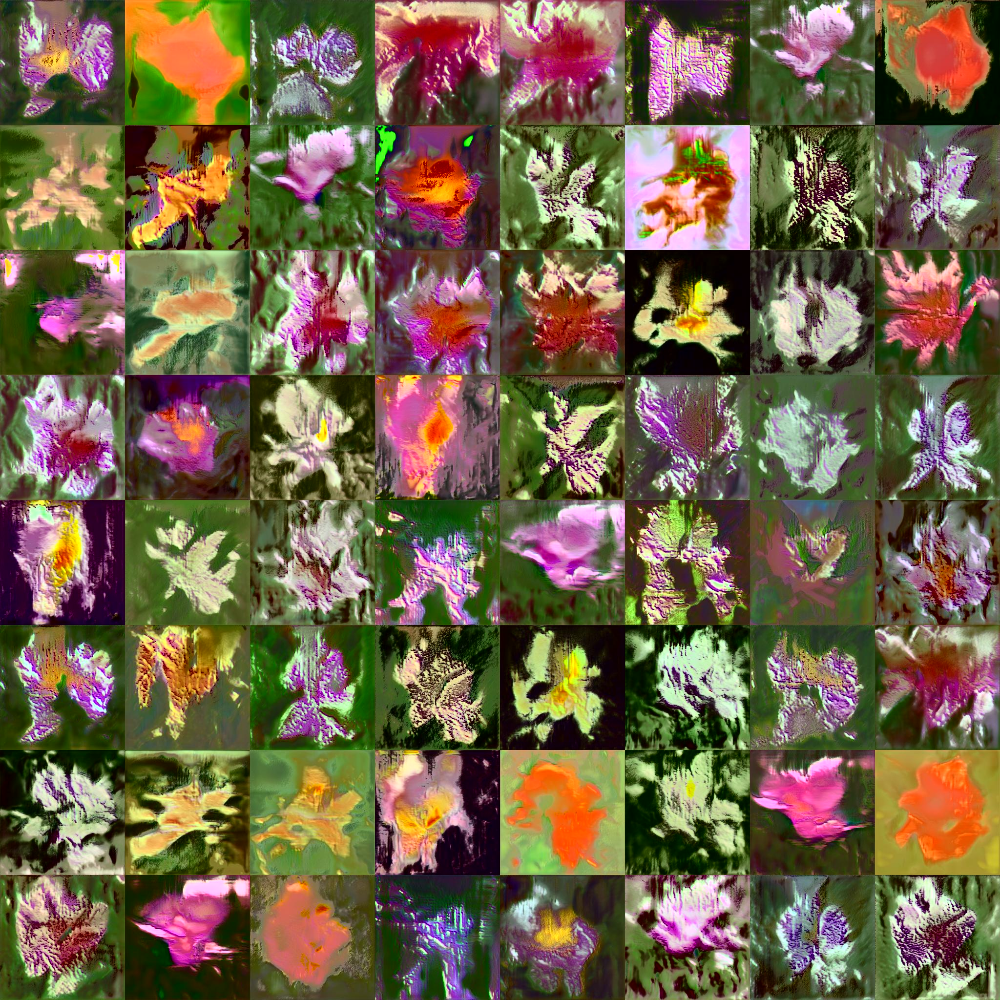


Figure 2: Trained image generated by StyleGAN - i49ii.jpg



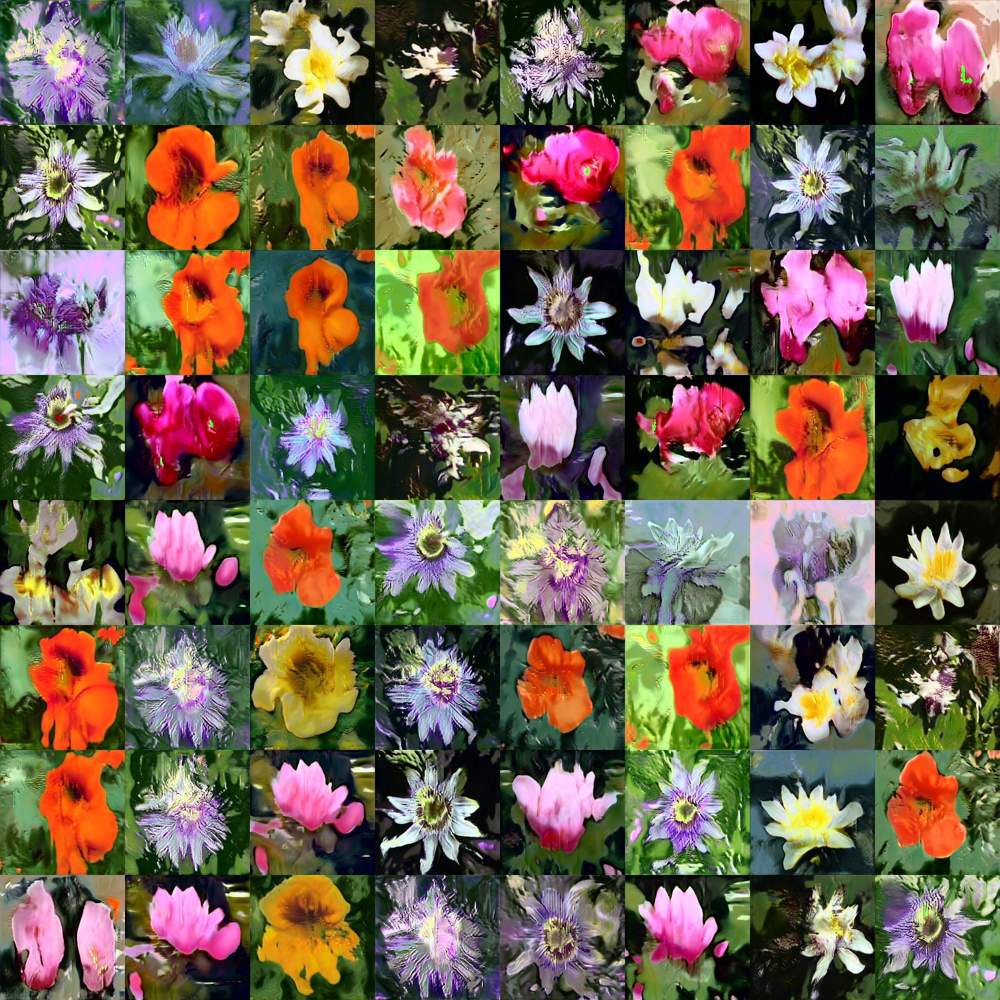


Figure 3: Trained image generated by StyleGAN - i97ii.jpg



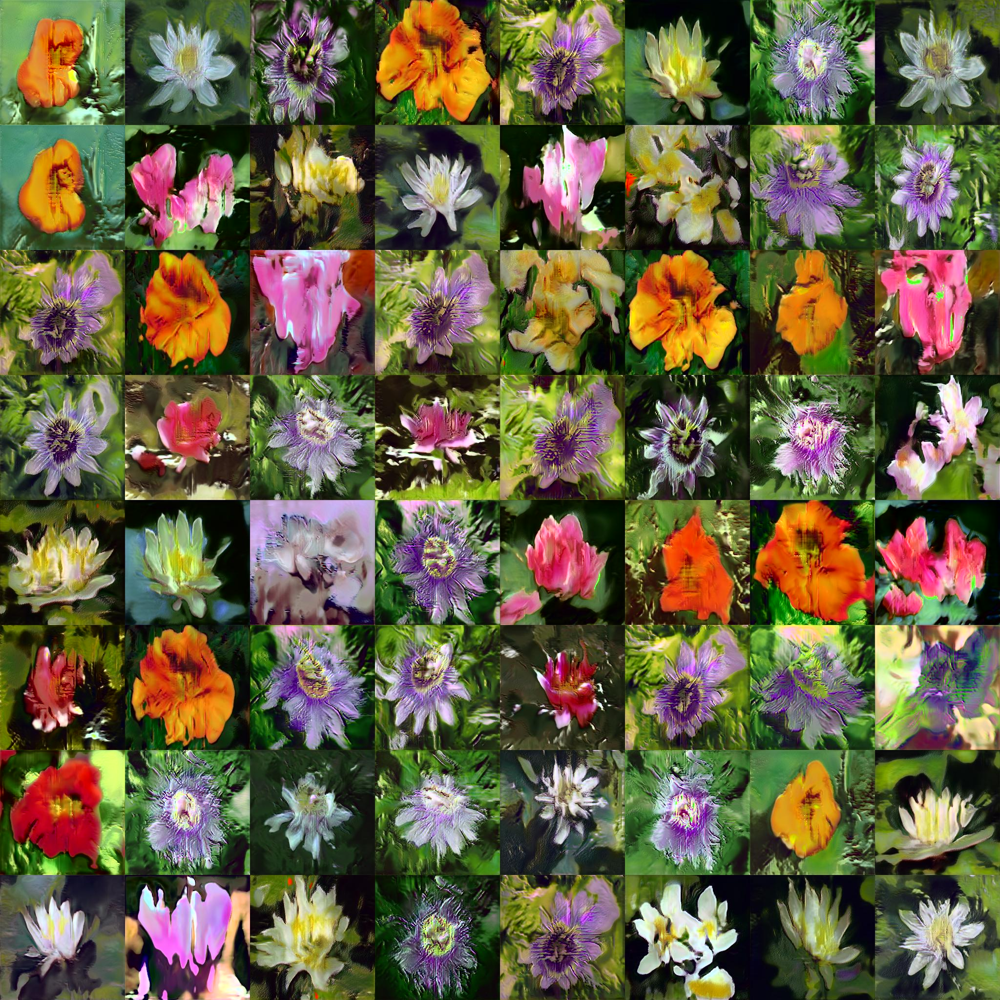


Figure 4: Trained image generated by StyleGAN - i151ii.jpg



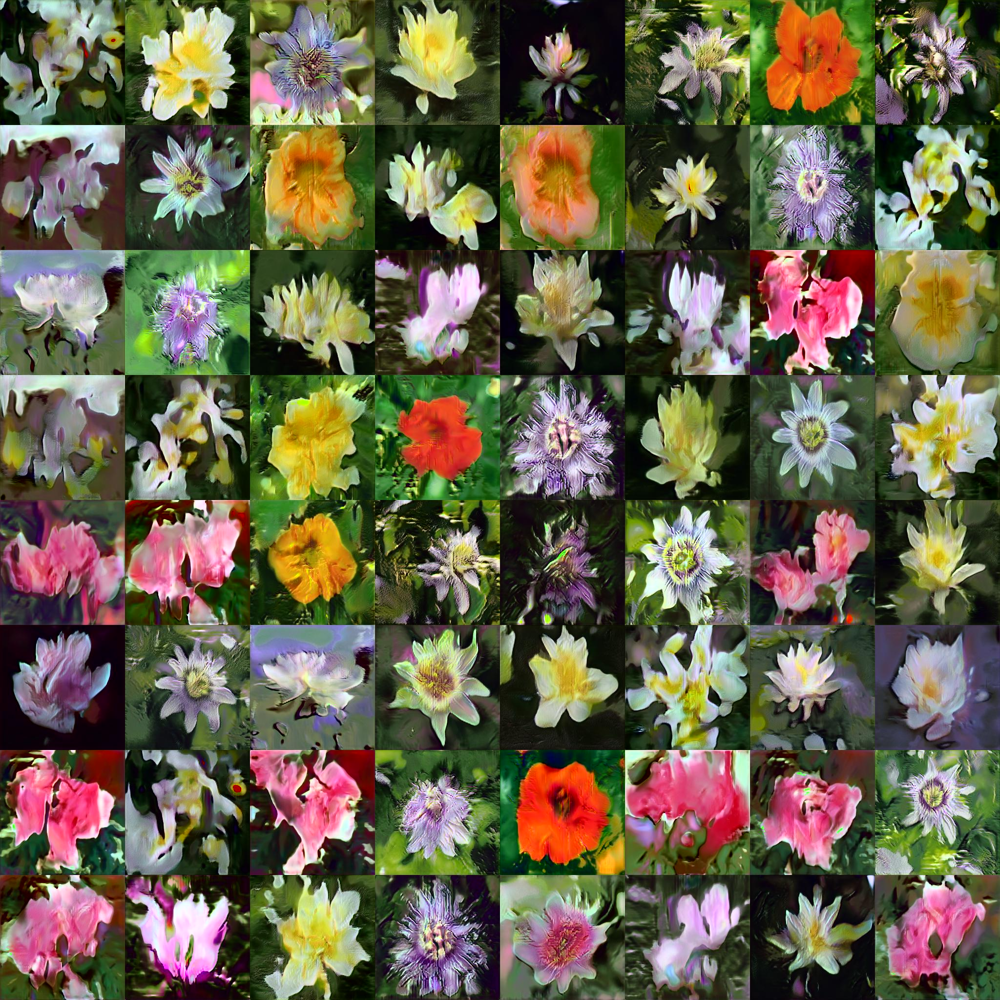


Figure 5: Trained image generated by StyleGAN - i175ii.jpg



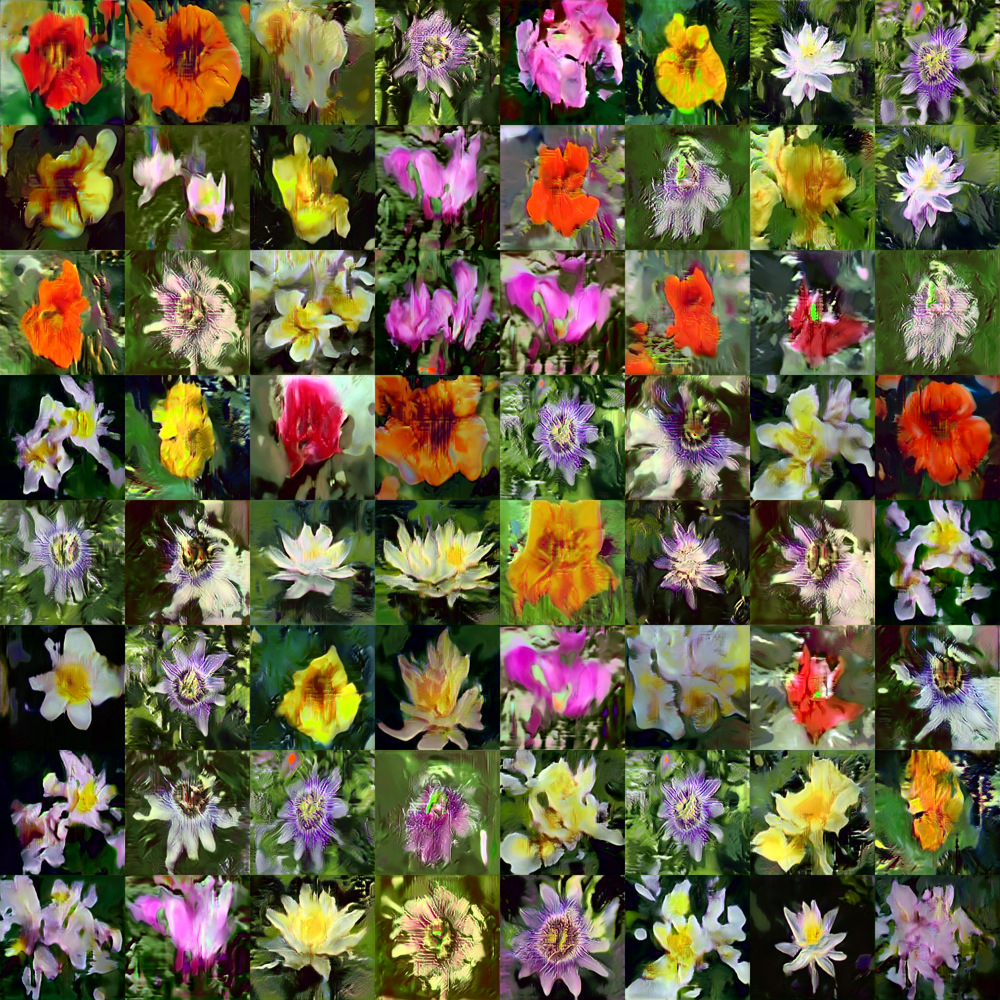


Figure 6: Last Trained image generated by StyleGAN - i200ii.jpg



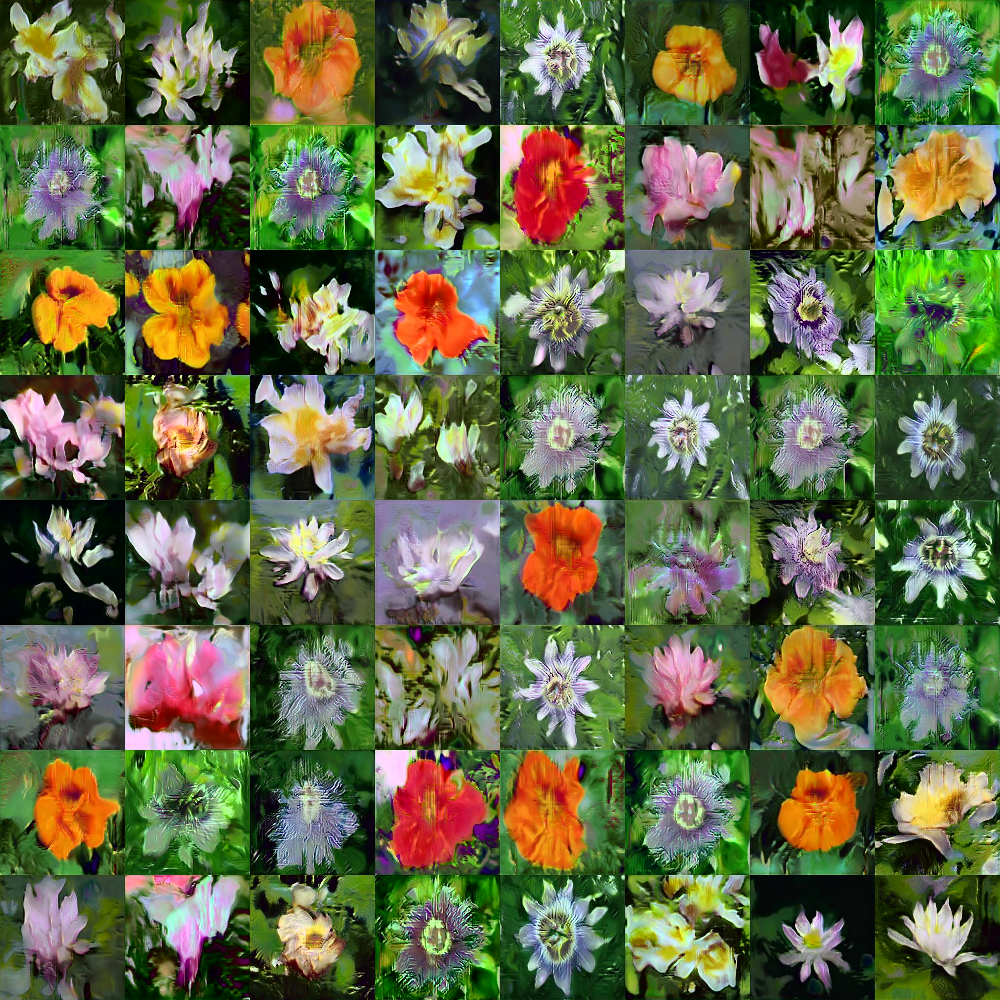

In [ ]:
from IPython.display import Image, display
print ('Figure 1: Trained image generated by StyleGAN - i1ii.jpg')
print ('')
display(Image('Fig 1 - i1ii.jpg', width = 1000))
print ('')
print ('Figure 2: Trained image generated by StyleGAN - i49ii.jpg')
print ('')
display(Image('Fig 2 - i49ii.jpg', width = 1000))
print ('')
print ('Figure 3: Trained image generated by StyleGAN - i97ii.jpg')
print ('')
display(Image('Fig 3 - i97ii.jpg', width = 1000))
print ('')
print ('Figure 4: Trained image generated by StyleGAN - i151ii.jpg')
print ('')
display(Image('Fig 4 - i151ii.jpg', width = 1000))
print ('')
print ('Figure 5: Trained image generated by StyleGAN - i175ii.jpg')
print ('')
display(Image('Fig 5 - i175ii.jpg', width = 1000))
print ('')
print ('Figure 6: Last Trained image generated by StyleGAN - i200ii.jpg')
print ('')
display(Image('Fig 6 - i200ii.jpg', width = 1000))

### Style Mixing Image Results

Below **Figures 7-11** were generated using a Style Mixing technique by StyleGAN that allows for greater control over the generated imagery by novel mixing reglarization that decorrelates neighbouring styles. Additional images for Style Mixing model can be found the following link: https://drive.google.com/drive/folders/1JkGpSuFAzsO9S_WIMrYzJhpwI-mUOk-N?usp=sharing

Figure 7: Style Mixing image generated by StyleGAN - i1mm.jpg



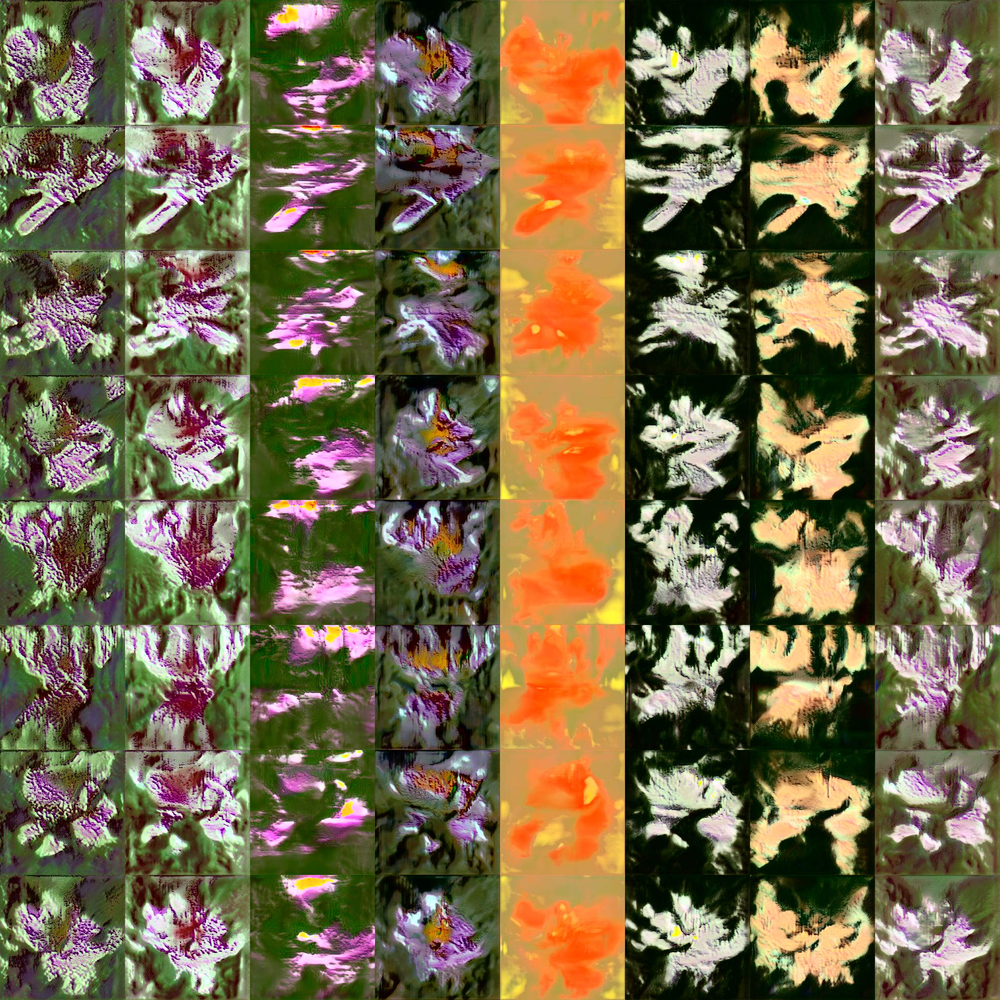


Figure 8: Style Mixing image generated by StyleGAN - i49mm.jpg



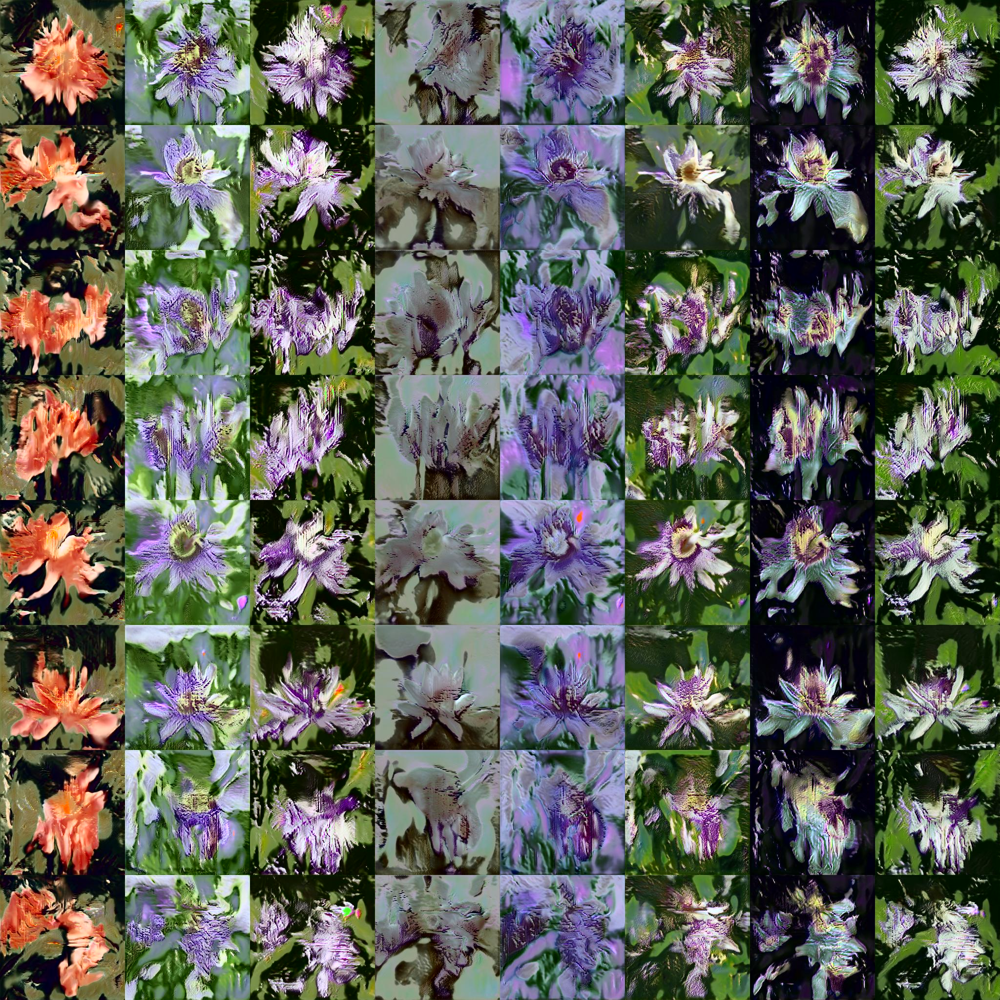


Figure 9: Style Mixing image generated by StyleGAN - i103mm.jpg



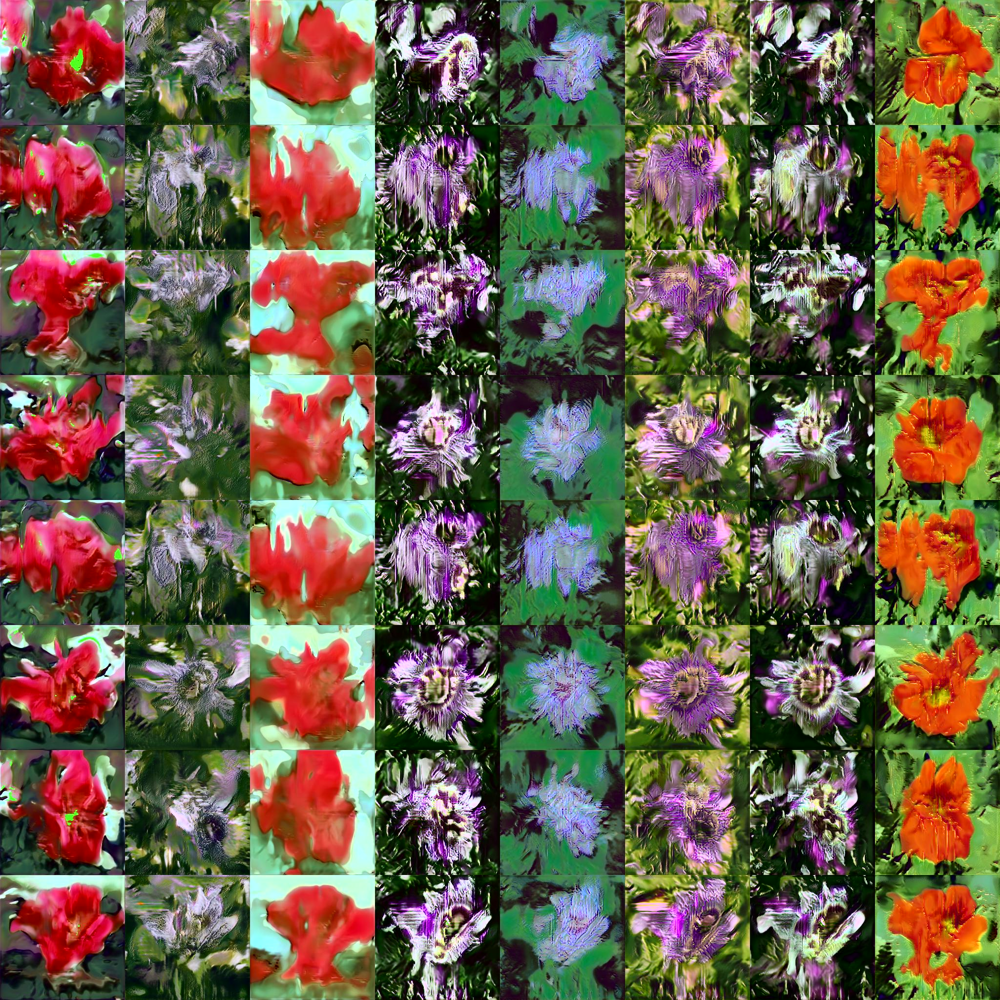


Figure 10: Style Mixing image generated by StyleGAN - i151mm.jpg



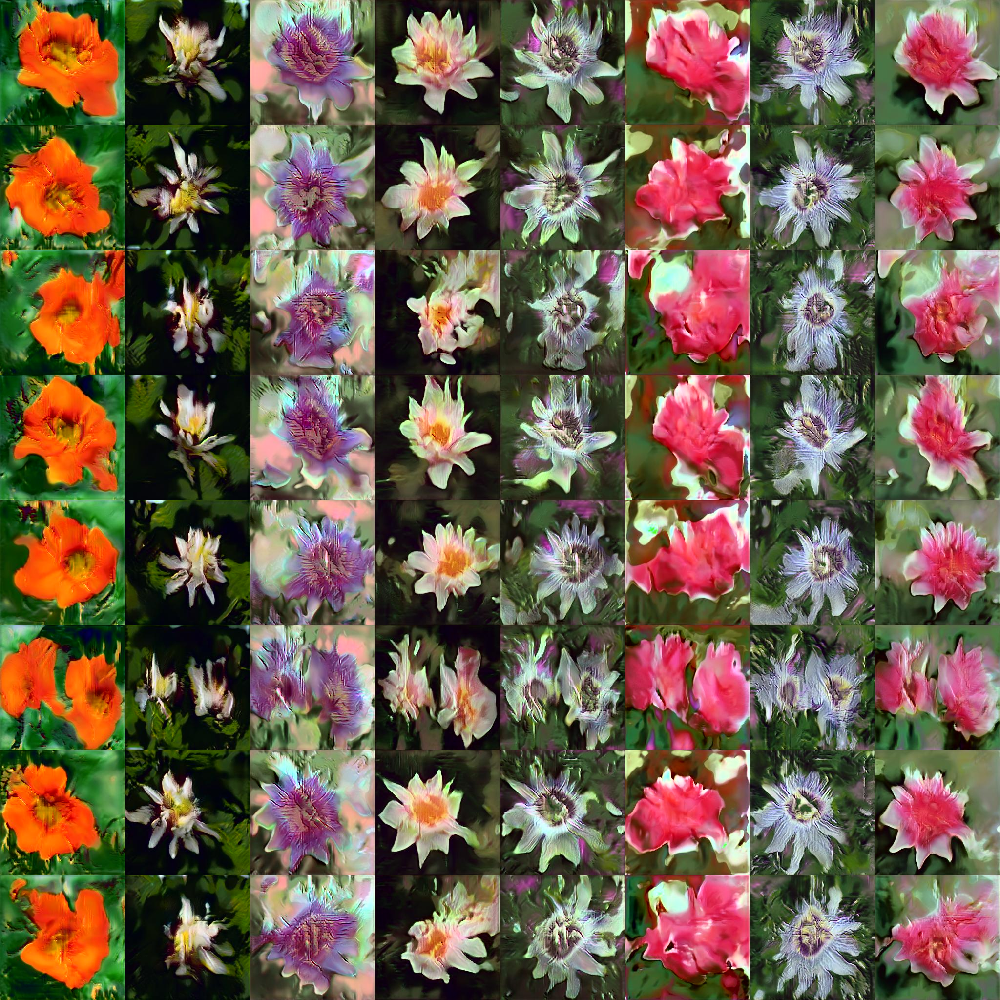


Figure 11: Style Mixing image generated by StyleGAN - i200mm.jpg



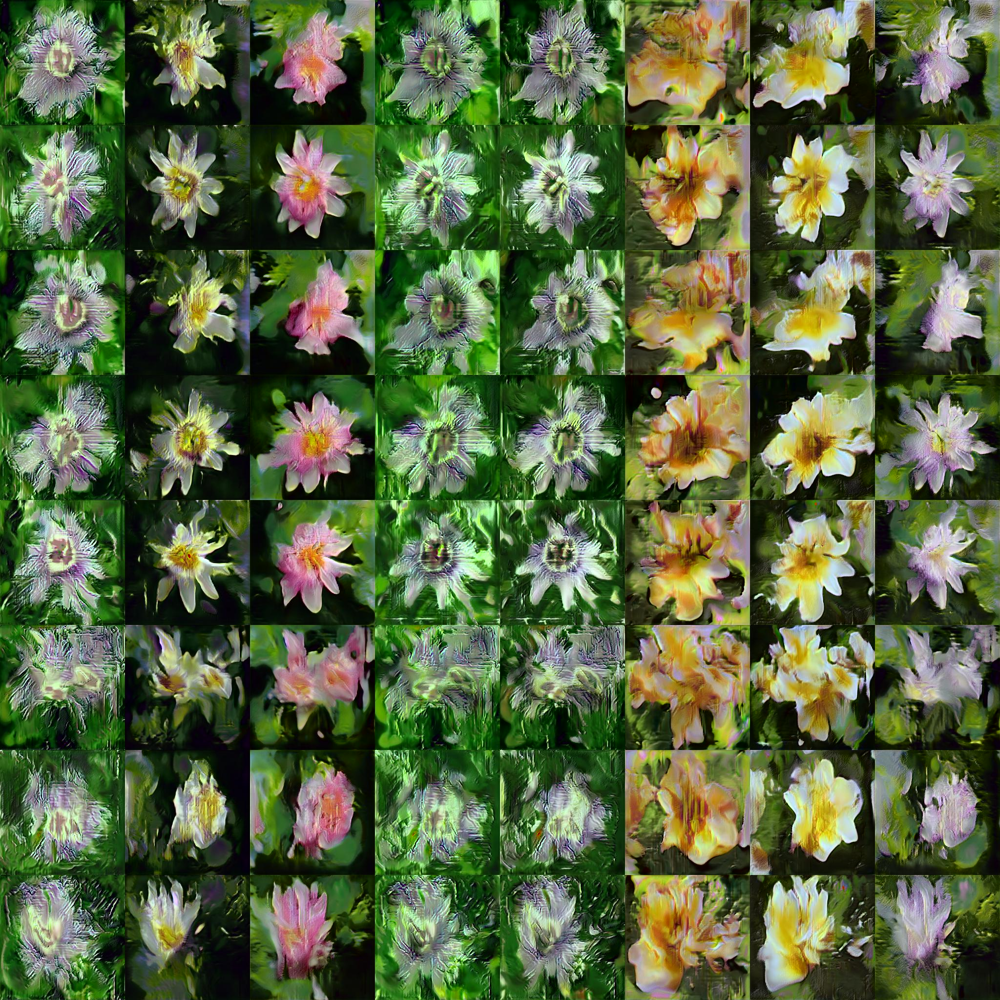

In [ ]:
from IPython.display import Image, display
print ('Figure 7: Style Mixing image generated by StyleGAN - i1mm.jpg')
print ('')
display(Image('Fig 7 - i1mm.jpg', width = 1000))
print ('')
print ('Figure 8: Style Mixing image generated by StyleGAN - i49mm.jpg')
print ('')
display(Image('Fig 8 - i49mm.jpg', width = 1000))
print ('')
print ('Figure 9: Style Mixing image generated by StyleGAN - i103mm.jpg')
print ('')
display(Image('Fig 9 - i103mm.jpg', width = 1000))
print ('')
print ('Figure 10: Style Mixing image generated by StyleGAN - i151mm.jpg')
print ('')
display(Image('Fig 10 - i151mm.jpg', width = 1000))
print ('')
print ('Figure 11: Style Mixing image generated by StyleGAN - i200mm.jpg')
print ('')
display(Image('Fig 11 - i200mm.jpg', width = 1000))
print ('')

### Noise Truncated Image Results

**Figures 12 - 14** below illustrate images produced using the "truncation trick" outlined in the "[A Style-Based Generator Architecture for Generative Adversarial Networks.pdf](https://arxiv.org/abs/1812.04948)", Appendix B.  Sample images for the noise truncated model can be found [here](https://drive.google.com/drive/folders/10HVfjNZKq5oqYnC4WQlvT-F4OWknTRqr?usp=sharing).  

The goal of truncation is to allow the model to learn to produce images where the categories have a few number of representative images within the dataset. The images produced by Truncation trick are uncurated set of images produced by style-based generator.

Figure 12: Noise Truncation Trick image generated by StyleGAN - i1tt.jpg



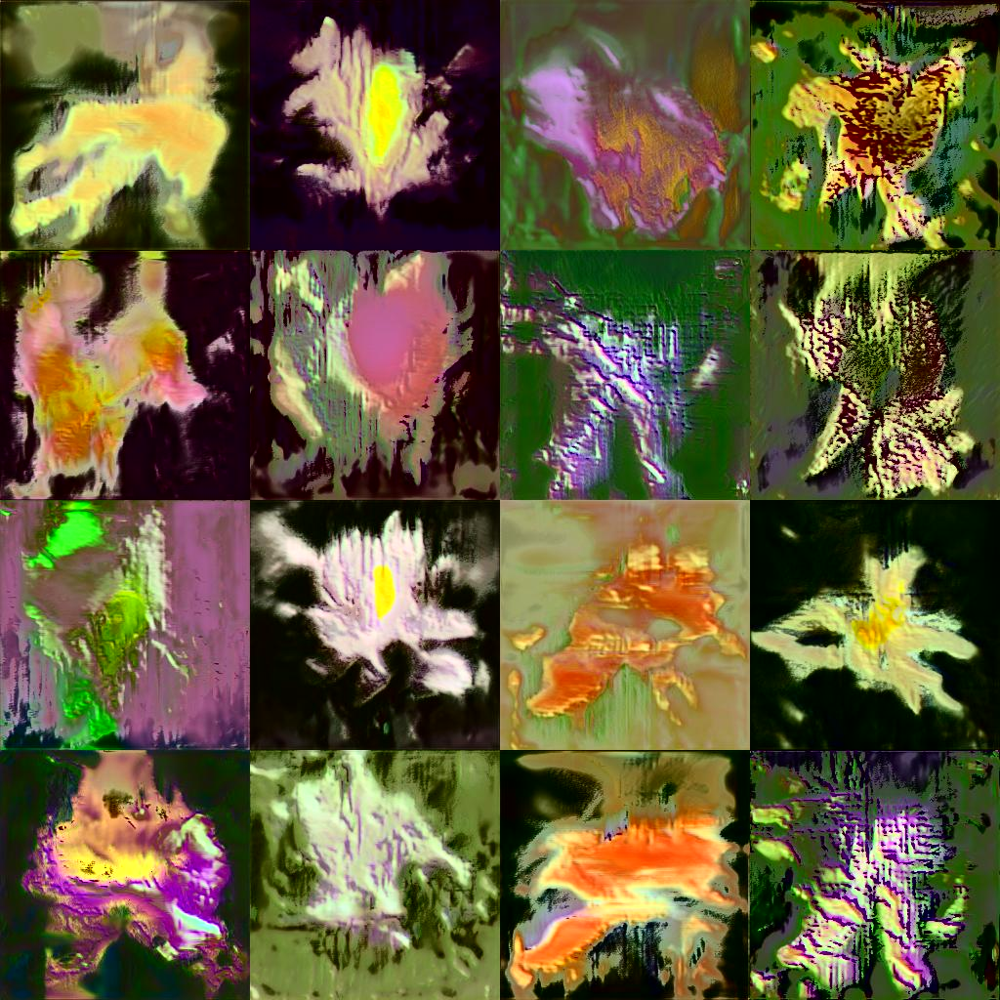


Figure 13: Noise Truncation Trick image generated by StyleGAN - i97tt.jpg



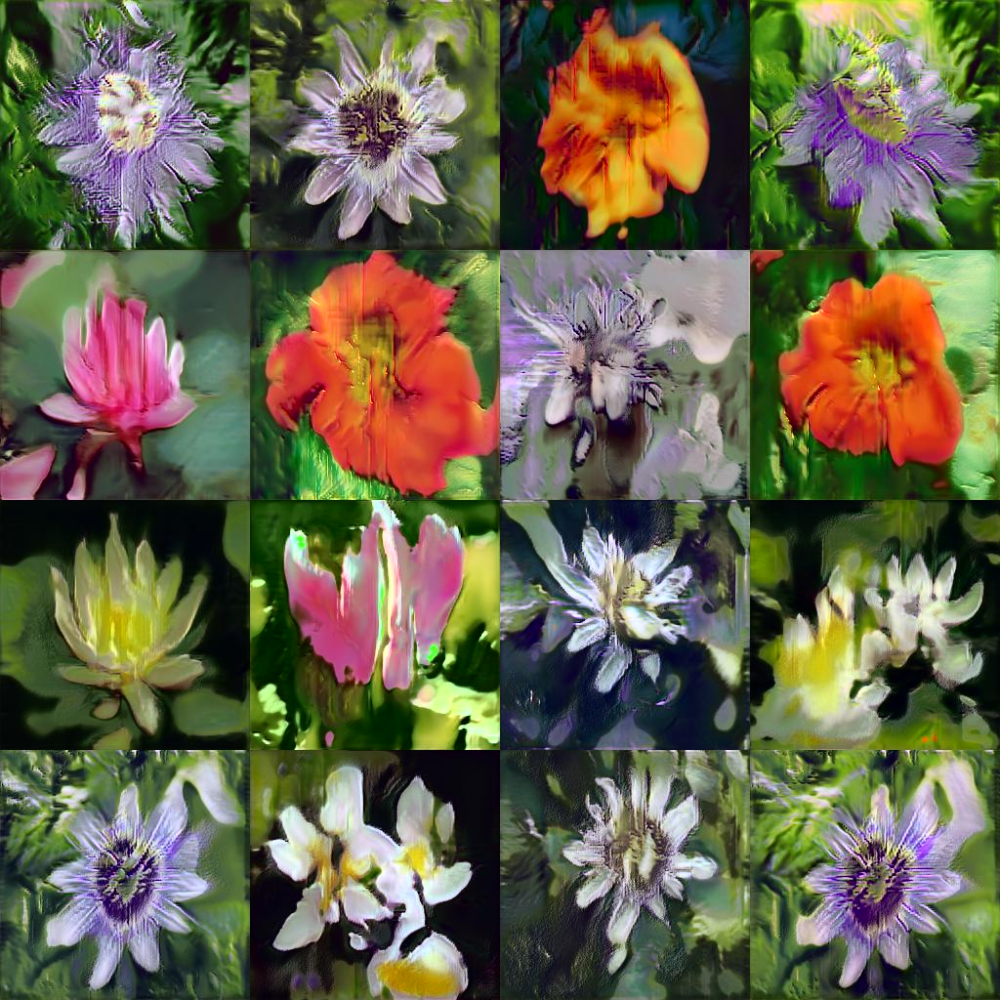


Figure 14: Noise Truncation Trick image generated by StyleGAN - i200tt.jpg



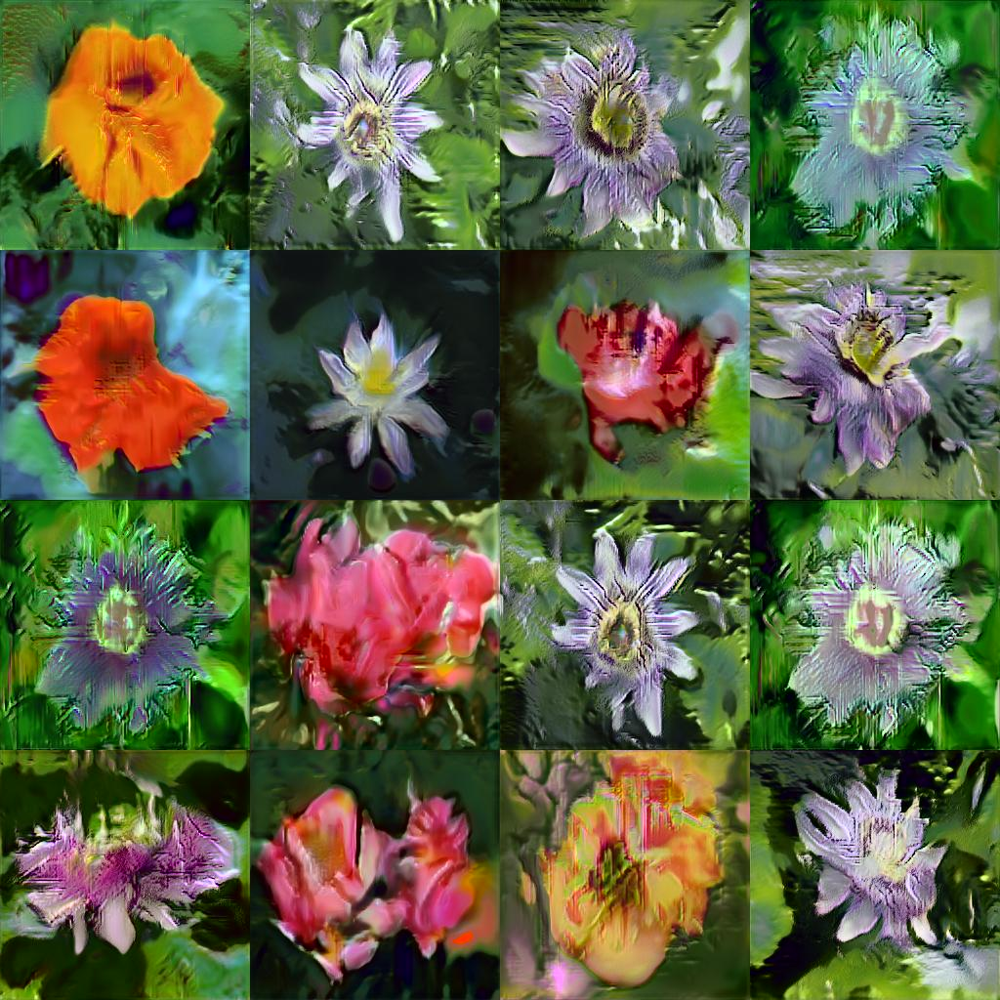

In [ ]:
from IPython.display import Image, display
print ('Figure 12: Noise Truncation Trick image generated by StyleGAN - i1tt.jpg')
print ('')
display(Image('Fig 12 - i1tt.jpg', width = 1000))
print ('')
print ('Figure 13: Noise Truncation Trick image generated by StyleGAN - i97tt.jpg')
print ('')
display(Image('Fig 13 - i97tt.jpg', width = 1000))
print ('')
print ('Figure 14: Noise Truncation Trick image generated by StyleGAN - i200tt.jpg')
print ('')
display(Image('Fig 14 - i200tt.jpg', width = 1000))
print ('')

#### *Figures

All figures used in this notebook can be found [here](https://drive.google.com/drive/folders/1-M6EN870QelTPoNIj56FpMx8GvoPu2OD?usp=sharing) for reference.

# Discussion

The model was built by using a slightly modified version of the Keras-implemented StyleGAN network provided by manicman1999, StyleGAN-Keras. (2019). GitHub repository, *https://github.com/manicman1999/StyleGAN-Keras*. The modification present was the reduction of the number of FC layers in the style extraction; this likely contributed to the results of the training, particularly for the higher order styles. However, this came at the advantage of signifcantly faster training. The images that were used are  from *University of Oxford’s Visual Geometry Group (VGG)* [7]. Total number of images used were 8,189 images of 102 categories of different flowers. For all images, we resized the training image to 256x256 scale and converted them to .jpg compressed image format. The model was trained from scratch.<br>
<br>
Examples of our trained floral image samples are shown in **Figure 1** to **Figure 6** below. For each result image provided, there are 8x8 images of varying categories of flowers that are generated. Network was ultimately trained for 200,000 steps with a batch size of 8 over 7 days.<br>





### Model Evaluation Discussion

Figure 1: First Trained image generated by StyleGAN - i1ii.jpg



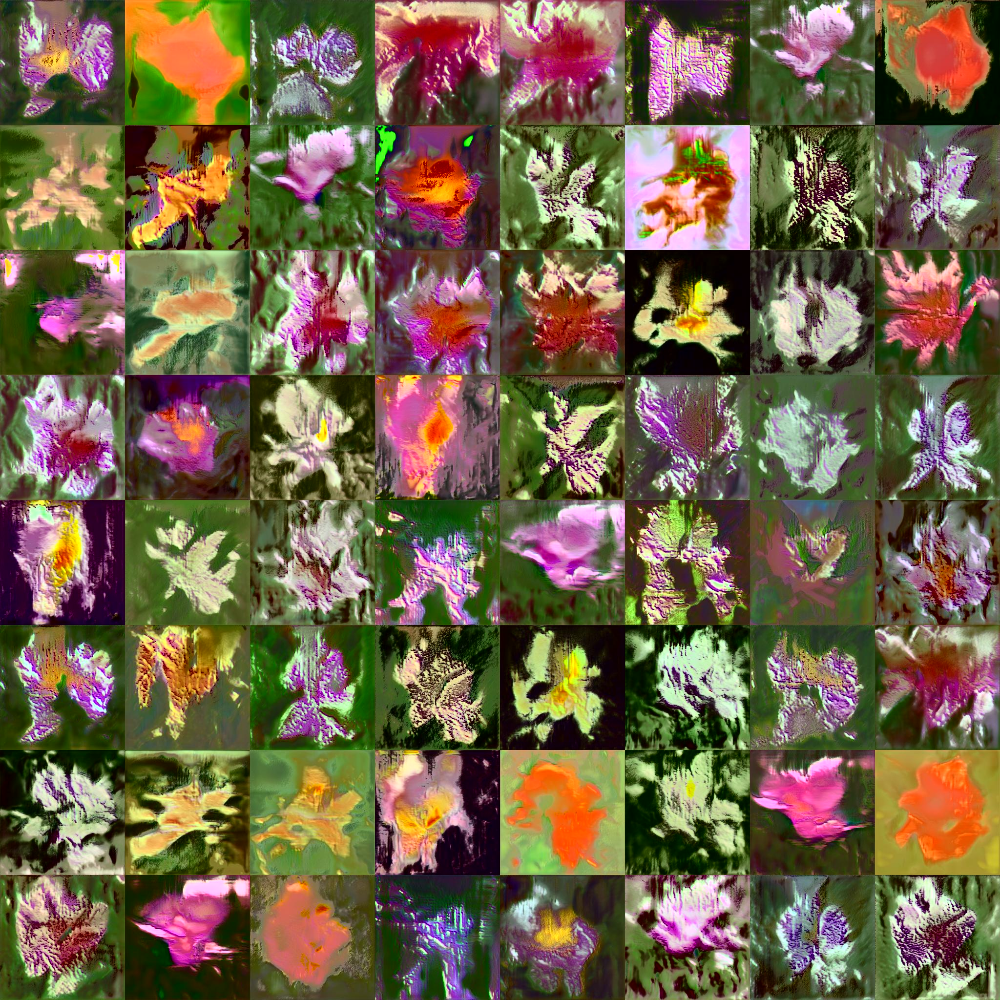

In [ ]:
from IPython.display import Image, display
print ('Figure 1: First Trained image generated by StyleGAN - i1ii.jpg')
print ('')
display(Image('Fig 1 - i1ii.jpg', width = 1000))

As can be seen in **Figure 1** above, although the shape of each flower is defined by the colour boundaries of the flower, it is difficult to differentiate what flowers' styles were combined to produce the image. Colours are for the most part distorted since network has only been trained for only 1000 steps. 

Generally, the images are blurry and there is no clear definition of a flower in most of the images but there is a blurry presentation of colour where a flower should be.

Figure 15: i1ii.jpg Flower pics with Gaussian Noise



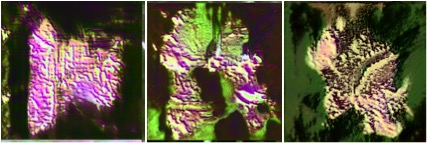


Figure 16: i1ii.jpg Flower pics with Semantic Segmentation similarities



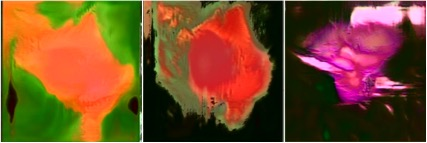

In [ ]:
print ('Figure 15: i1ii.jpg Flower pics with Gaussian Noise')
print ('')
display(Image('Fig 15 - gaussian_noise.jpg', width = 800))
print ('')
print ('Figure 16: i1ii.jpg Flower pics with Semantic Segmentation similarities')
print ('')
display(Image('Fig 16 - semantic_segmentation.jpg', width = 800))

Looking even more closely at the individual flowers from **Figure 1** as presented above in **Figures 15 and 16**, it is should be noted that the Gaussian "noise" added to the image as part of the generator model is very visible in **Figure 15** as the flower portion of the picture has significant randomized distortion similar to noise.  At this point the image generator has not mastered the separation of boundaries both within the flower itself and outside of the flower where foilage is expected to take shape. 

StyleGAN has however, mastered a basic separation in colours similar to Semantic Segmentation.  **Figure 16** above shows the clear separation between the colours and the contrast between the dark and the light portions of selected pictures that were generated after 1000 steps.<br>
<br>

Figure 6: Last Trained image generated by StyleGAN - i200ii.jpg



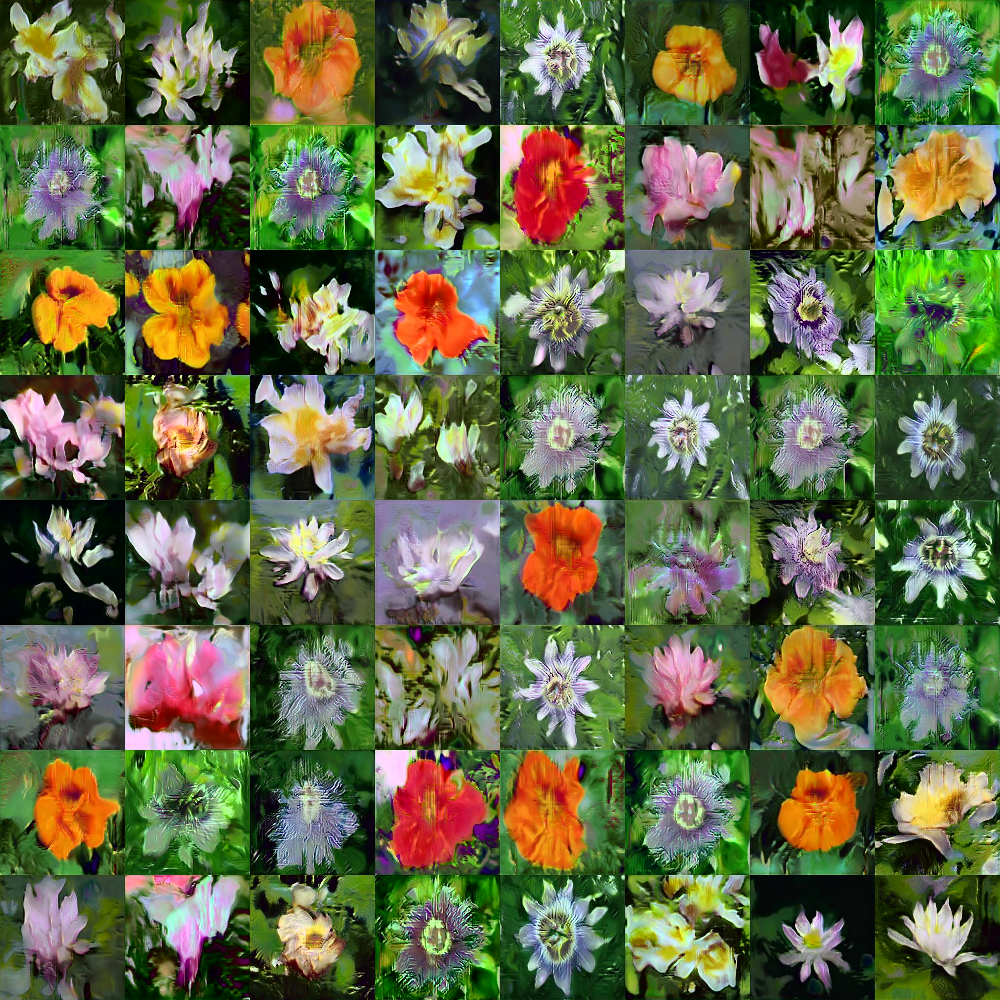

In [ ]:
print ('Figure 6: Last Trained image generated by StyleGAN - i200ii.jpg')
print ('')
display(Image('Fig 6 - i200ii.jpg', width = 1000))

In **Figure 6** shown above, we can begin to differentiate the flowers from the foilage that surround the flower in the image. In addition, colours and shape of the flowers are more defined. The petals of the flowers can be seen very clearly and there is a lot more gentler/smoother shading of colours within the petals of the flowers.

While categories of generated flower images are randomly chosen in the code, as evident through the resulting image samples, some flower types are generated more often than the other. For instance, number of images generated that look similar to Watercress and Passion Flower are prominent in **Figure 6**. This is due to the imbalance in our dataset. Number of images stored per class in the VGG dataset [7] were not balanced and as a result, classes that contained higher number of image examples in the dataset were more dominantly selected by the generator.

Figure 17: Pics over Training showing progression of Flowers



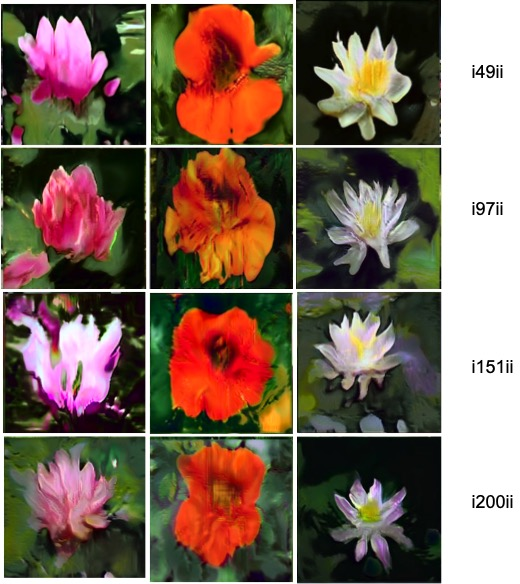

In [ ]:
print ('Figure 17: Pics over Training showing progression of Flowers')
print ('')
display(Image('Fig 17 - progression.jpg', width = 800))

**Figure 17** above shows the progression of similar flowers (or at least those that seem to look similar) over the 200K steps.

The i49ii.jpg pictures show a very rudimentary and rounded outline of flower petals when compared to the improvement over progressive steps from 49K to 97K to 151K and finally to 200K. The flower shape has improved significantly to mimic the soft petals of the flower. The colours are more blended as they would be in realistic flowers with shades of white and yellow at the centre.

As the flowers are an amalgam of two flowers it is a challenge to determine what a hybrid of the flower should appear. And so the judgement of completion of effort is also difficult to judge.

It is important note that the original result images on GitHub were, produced by [manicman1999](https://github.com/manicman1999/StyleGAN-Keras), were rendered after 1,000,000 steps with a batch size of 8. Our model was run only 200,000 steps in 7 days. So the difference in the amount of training time needs to be acknowledged along with the computing power to reach a convergence of training stage in the process.




### Style Mixing Discussion

Figure 18: Style Mixing - Double Flowers



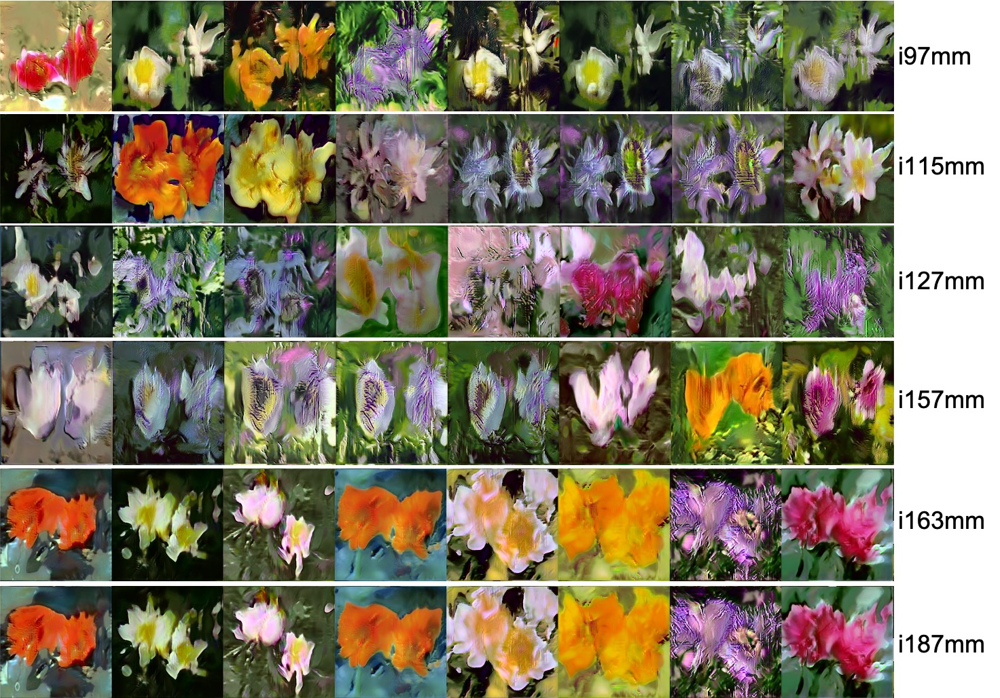

In [ ]:
from IPython.display import Image, display
print ('Figure 18: Style Mixing - Double Flowers')
print ('')
display(Image('Fig 18 - double_flowers_mixing.jpg', width = 1000))

**Figure 18** above shows selected rows of pictures from the Style Mixing GAN model that allows for novel mixing regularization to allow for decorrelation of neighbouring styles and enables fine-grained control over the generated imagery.

Although our StyleGAN model was run over 200K steps over 7 day period,  this alotted time was not sufficient to clearly identify specific styles or textures being generated during the learning process within the images. We did however, see one specific pattern being repeated in several of the images.  Many of the Style Mixing images contained one row of double flowers in the image.  The Style generator in this case was attempting to mimic two flowers within the row as part of the training as a style. This can be considered active fine-grained control over the generated imagery.

In general however, it is very difficult to identify specific Styles and hence Style Mixing for the flowers as the GAN training on flowers is not entirely complete.

### Noise Truncation Discussion

Figure 14: Noise Truncation Trick image generated by StyleGAN - i200tt.jpg



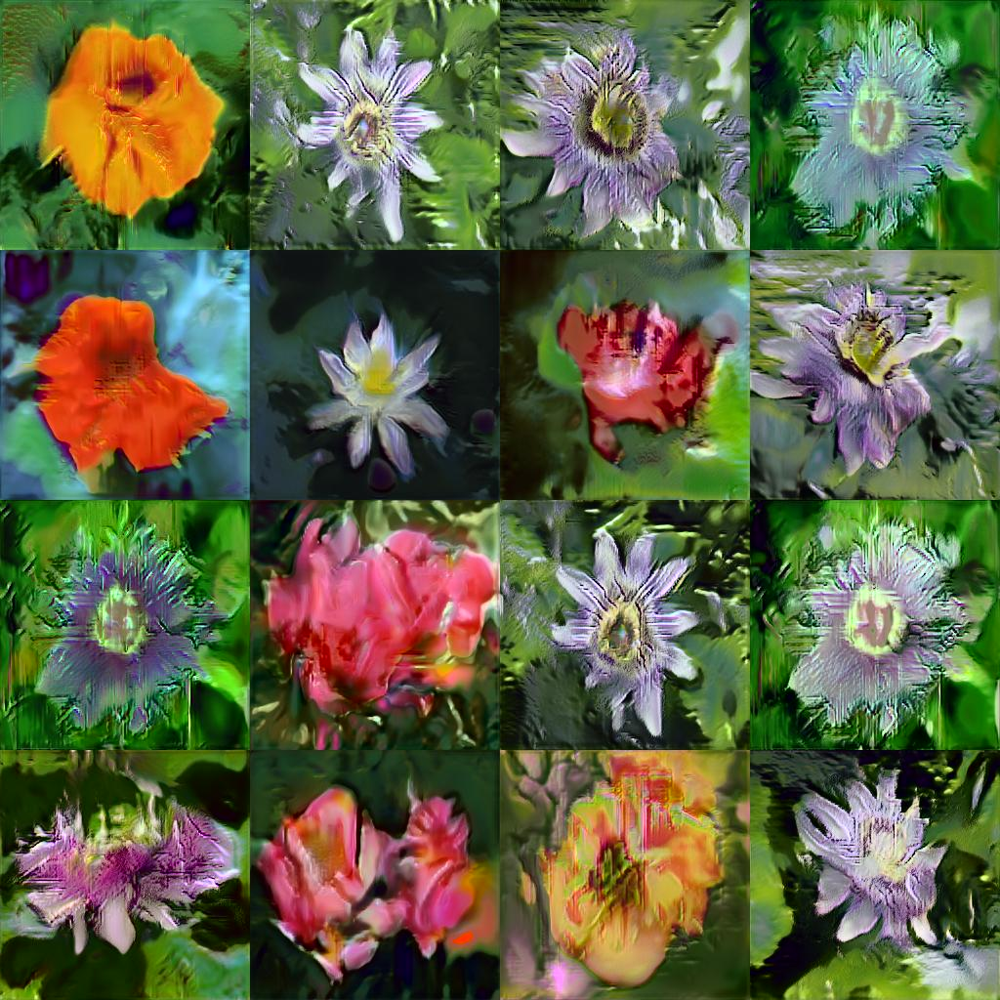

In [ ]:
from IPython.display import Image, display
print ('Figure 14: Noise Truncation Trick image generated by StyleGAN - i200tt.jpg')
print ('')
display(Image('Fig 14 - i200tt.jpg', width = 1000))
print ('')

**Figure 14** above show the final iteration of image from our model. These are uncurated set of images produced by our model with the flower dataset. 

It visually difficult to identify differences between full evaluation images (ii) and "truncation trick" images (tt). Further training and mathematical results identification is required to conclusively understand/identify the changes within the flowers images produced. 



#Limitations

There are very specific limitations to this project (dataset and code) that need to be acknowledged as part of the analaysis of results for the above Keras-based StyleGAN model.

First, the Keras model publically available for StyleGAN ([manicman1999](https://github.com/manicman1999/StyleGAN-Keras)) did not include specific mathematical/graphical interpretation for the results. Considerable time was allocated to cleaning and modifying the existing code and subsequently running it for 7 days.  Further improvements that may help with the interpretation of results could include a numerical and graphical representation of improvements in images in a given interval of steps.  This would allow for better discussion and analysis of the results for future model runs.

Second, the flower dataset is not ideal for results interpretation.  In looking at Flickr- Faces-HQ (FFHQ) dataset, it would be somewhat intuitive to note if a human face image generated by GAN is not of proper proportions. Example, the nose is slightly off on the face or eyes are larger than anticipated, etc.  These errors would allow for a visual cue to further investigate the results for issues or errors.  But with flowers dataset the visual cues are not as intuitive as is the case with human faces.  Flowers, in general, are easily mutable in nature depending on their environment and cross-breeding.  So for this project, it was diffcult to note if the flower created by the styles were "complete".  The only visual cue was resolution of the pictures and intuitive interpretation of how the petals and foilage changed from one step to the next. The results offer an abstraction of images that could exist in nature.  Although there is generally symmetry in flower in nature,  flowers are known to be asymmetric as well. So perhaps a more symmetric flower dataset if ran to million steps may yield better interpretable results. It is also important to note that the dataset size is significantly small when compared to the FFHQ which was 50K images. So the random selection of images as input into this model is limited. Additionally, in retrospect, it would have been wise to keep the 8 FC layers, as the relationships between the image properties of the flowers could be more complex than facial images. 

Third, for GAN specifically, more time and computing power is required. Even after 7 days of running the model, the results are not conclusive.  But doing a million steps would require 35 days of continuously running the model. This limitation also played into difficulties in interpreting the results as the images produced by StyleGAN still remain incomplete.

Fourth, fine-tuning parameters can help identify different styles in addition to above may produce better and inerpretable results.

Finally, styles could not be identified clearly with our model. Again, this may be attributed to the 5 FC layers used instead of the 8. More effort in coding and computing time would be helpful to further improve the model and produce results that would be intuitively interpretable even with the flower dataset.

# Conclusions

StyleGAN model has a significant number of facets within its code that can be manipulated to improve the learning process of the adversarial model.  To ensure that they all work together to produce clear and interpretable results is a challenge.  GAN models in themselves are not easy to manipulate but StyleGAN attempts to address these challenges to improve the adversarial learning process. 

Nonetheless, other challenges remain that seem to impact the results beyond the challenges of code creation, like type of dataset, computing power, time allocated and intuitiveness of results interpretation.

Our model attempted to address some these challenges to produce results that do show improvements in StyleGAN produced images over time.  Although we were unable to produce conclusive results similar to the ones in [StyleGAN paper](https://arxiv.org/abs/1812.04948), we were able to mimic a few key aspects of this complex model in our project work.

# References

Abdal, R., Qin, Y., & Wonka, P. (2019). Image2StyleGAN: How to Embed Images     Into the StyleGAN Latent Space?. *International Conference on Computer Vision (ICCV)*. 4431-4440. doi: 10.1109/ICCV.2019.00453.<br>

Brock, A., Donahue, J., & Simonyan, K. (2019). Large Scale GAN Training for High Fidelity Natural Image Syntehsis. *International Conference on Learning Representations*. Retrieved from https://arxiv.org/pdf/1809.11096.pdf.<br>

Nikitko, D. (2018). Stylegan-Endocer. Github Repository, https://github.com/Puzer/stylegan-encoder.

Géron, A. (2019). *Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow*. Sebastopol, CA: O'Reilly.<br>

Goodfellow, I.J., Pouget-Abadie, J., Mirza, M., Xu, B., Warde-Farley, D., Ozair, S., Courville, A., & Bengio, Y. (2014). Generative adversarial nets. *Advances in neural information processing systems*. 2672-2680. Retrieved from https://papers.nips.cc/paper/5423-generative-adversarial-nets.pdf.<br>

Karras, T., Laine, S., & Aila, T. (2019). A Style-Based Generator Architecture for Generative Adversarial Networks. *Conference on Computer Vision and Pattern Recognition (CVPR)*. 4396-4405. doi: 10.1109/CVPR.2019.00453.<br>

Karras, T., Laine, S., Aittala, M., & Hellsten, J. (2019). Analyzing and Improving the Image Quality of StyleGAN. *Conference on Computer Vision and Pattern Recognition (CVPR)*. 8110-8119. Retrieved from https://arxiv.org/pdf/1912.04958.pdf.<br>

Liu, Y. (2019). Controlled Modification of Generated (Style) GAN Latent Vectors. Retrieved from https://pdfs.semanticscholar.org/6af8/6e7d68f18b61af4ed18deecaef9de2e0ff85.pdf.<br>

Mann, M. (2019). StyleGAN Made with Keras. GitHub Repository, https://academia.stackexchange.com/questions/14010/how-do-you-cite-a-github-repository.<br>